# Data Preparation

In [1]:
import os, glob, random, json
from dataclasses import dataclass
from typing import List, Tuple

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# ----------------------------
# Reproducibility
# ----------------------------
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

SEED = 24
seed_everything(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# ----------------------------
# Config
# ----------------------------
@dataclass
class CFG:
    DATA_ROOT: str = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
    SCENES: Tuple[str, ...] = ("scene1", "scene2", "scene3", "scene4")
    PATCH_EXT: str = ".npz"

    # Global split (VD default)
    USE_GLOBAL_SPLIT: bool = True
    GLOBAL_TRAIN_RATIO: float = 0.80
    GLOBAL_VAL_RATIO: float = 0.10
    GLOBAL_TEST_RATIO: float = 0.10
    KEEP_VAL_TEST_NATURAL: bool = True

    # Keys inside npz
    X_KEY: str = "image"     # (12,512,512)
    A_KEY: str = "aerosol"   # (512,512) -> becomes 1 channel
    Y_KEY: str = "label"     # (512,512)

    # Fire patch definition
    FIRE_PATCH_MIN_RATIO: float = 0

    # Controlled train pool (VD default)
    USE_CONTROLLED_POOL: bool = True
    POOL_KEEP_FIRE: int = -1
    NONFIRE_PER_FIRE: int = 3

    # Training config (RAM-safe)
    IN_CHANNELS: int = 13
    H: int = 512
    W: int = 512
    BATCH_SIZE: int = 2
    NUM_WORKERS: int = 2
    LR: float = 1e-4
    EPOCHS: int = 20 

    VERBOSE: bool = True

cfg = CFG()

assert abs((cfg.GLOBAL_TRAIN_RATIO + cfg.GLOBAL_VAL_RATIO + cfg.GLOBAL_TEST_RATIO) - 1.0) < 1e-6
assert os.path.exists(cfg.DATA_ROOT), f"DATA_ROOT not found: {cfg.DATA_ROOT}"
print("DATA_ROOT OK:", cfg.DATA_ROOT)

Device: cuda
DATA_ROOT OK: /kaggle/input/sen2fire/Sen2Fire/Sen2Fire


In [2]:
def list_scene_files(data_root: str, scene_name: str, ext: str = ".npz") -> List[str]:
    scene_dir = os.path.join(data_root, scene_name)
    return sorted(glob.glob(os.path.join(scene_dir, f"*{ext}")))

scene_to_files = {}
total = 0
for s in cfg.SCENES:
    files = list_scene_files(cfg.DATA_ROOT, s, cfg.PATCH_EXT)
    scene_to_files[s] = files
    total += len(files)
    print(f"{s}: {len(files)} patches")

print("Total patches:", total)
if total == 0:
    raise RuntimeError("No patch files found. Check DATA_ROOT / PATCH_EXT.")

scene1: 864 patches
scene2: 594 patches
scene3: 504 patches
scene4: 504 patches
Total patches: 2466


In [3]:
def inspect_npz(npz_path: str):
    with np.load(npz_path) as data:
        return {k: (data[k].shape, str(data[k].dtype)) for k in data.keys()}

sample_path = scene_to_files[cfg.SCENES[0]][0]
print("Sample file:", sample_path)
info = inspect_npz(sample_path)
for k, (shape, dtype) in info.items():
    print(f"  - {k:>10s}: shape={shape}, dtype={dtype}")

for rk in [cfg.X_KEY, cfg.A_KEY, cfg.Y_KEY]:
    if rk not in info:
        raise KeyError(f"Missing key '{rk}' in npz. Found keys: {list(info.keys())}")

Sample file: /kaggle/input/sen2fire/Sen2Fire/Sen2Fire/scene1/scene_1_patch_10_1.npz
  -      image: shape=(12, 512, 512), dtype=int16
  -    aerosol: shape=(512, 512), dtype=float32
  -      label: shape=(512, 512), dtype=uint8


In [4]:
rows = []
for s, files in scene_to_files.items():
    for p in files:
        rows.append({"scene": s, "path": p})
manifest = pd.DataFrame(rows)

def fire_ratio_from_path(npz_path: str) -> float:
    with np.load(npz_path) as data:
        y = data[cfg.Y_KEY]
        if y.ndim == 3 and y.shape[-1] == 1:
            y = y[..., 0]
        yb = (y > 0).astype(np.uint8)
        return float(yb.mean())

fire_ratios = []
has_fire = []
for p in manifest["path"].tolist():
    r = fire_ratio_from_path(p)
    fire_ratios.append(r)
    has_fire.append(1 if r > cfg.FIRE_PATCH_MIN_RATIO else 0)

manifest["fire_ratio"] = fire_ratios
manifest["has_fire"] = has_fire

print("\nFULL dataset has_fire distribution:")
print(manifest["has_fire"].value_counts().sort_index())
print("\nFULL dataset has_fire ratio:")
print(manifest["has_fire"].value_counts(normalize=True).sort_index())


FULL dataset has_fire distribution:
has_fire
0    2117
1     349
Name: count, dtype: int64

FULL dataset has_fire ratio:
has_fire
0    0.858475
1    0.141525
Name: proportion, dtype: float64


In [5]:
def stratified_split(df, train_ratio, val_ratio, seed=42):
    df = df.sample(frac=1.0, random_state=seed).reset_index(drop=True)
    parts = []
    for cls in [0, 1]:
        sub = df[df["has_fire"] == cls].copy()
        n = len(sub)
        n_train = int(round(n * train_ratio))
        n_val   = int(round(n * val_ratio))
        sub_train = sub.iloc[:n_train]
        sub_val   = sub.iloc[n_train:n_train+n_val]
        sub_test  = sub.iloc[n_train+n_val:]
        parts.append((sub_train, sub_val, sub_test))

    train_df = pd.concat([parts[0][0], parts[1][0]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    val_df   = pd.concat([parts[0][1], parts[1][1]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    test_df  = pd.concat([parts[0][2], parts[1][2]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    return train_df, val_df, test_df

train_pool_df, val_df, test_df = stratified_split(
    manifest,
    train_ratio=cfg.GLOBAL_TRAIN_RATIO,
    val_ratio=cfg.GLOBAL_VAL_RATIO,
    seed=SEED
)

print("\nGLOBAL split counts:")
print("  Train pool:", len(train_pool_df))
print("  Val      :", len(val_df))
print("  Test     :", len(test_df))

# Controlled pool applies to TRAIN only
if cfg.USE_CONTROLLED_POOL:
    fire_df   = train_pool_df[train_pool_df["has_fire"] == 1].copy()
    nofire_df = train_pool_df[train_pool_df["has_fire"] == 0].copy()

    n_fire_total = len(fire_df)
    n_nofire_total = len(nofire_df)

    n_fire_keep = n_fire_total if cfg.POOL_KEEP_FIRE in (-1, None) else min(cfg.POOL_KEEP_FIRE, n_fire_total)
    fire_keep = fire_df.sample(n=n_fire_keep, random_state=SEED) if n_fire_keep > 0 else fire_df.iloc[:0]

    n_nofire_keep = min(n_nofire_total, n_fire_keep * int(cfg.NONFIRE_PER_FIRE))
    nofire_keep = nofire_df.sample(n=n_nofire_keep, random_state=SEED) if n_nofire_keep > 0 else nofire_df.iloc[:0]

    train_df = pd.concat([fire_keep, nofire_keep]).sample(frac=1.0, random_state=SEED).reset_index(drop=True)

    print("\nTRAIN controlled sampling:")
    print(f"  fire_total_in_pool   : {n_fire_total}")
    print(f"  nofire_total_in_pool : {n_nofire_total}")
    print(f"  fire_kept            : {len(fire_keep)}")
    print(f"  nofire_kept          : {len(nofire_keep)} (NONFIRE_PER_FIRE={cfg.NONFIRE_PER_FIRE})")
    print(f"  train_final          : {len(train_df)}")
else:
    train_df = train_pool_df.copy()

train_paths = train_df["path"].tolist()
val_paths   = val_df["path"].tolist()
test_paths  = test_df["path"].tolist()

# leakage check
assert len(set(train_paths)&set(val_paths))==0
assert len(set(train_paths)&set(test_paths))==0
assert len(set(val_paths)&set(test_paths))==0

print("\nFinal used split sizes:")
print("  train:", len(train_paths))
print("  val  :", len(val_paths))
print("  test :", len(test_paths))


GLOBAL split counts:
  Train pool: 1973
  Val      : 247
  Test     : 246

TRAIN controlled sampling:
  fire_total_in_pool   : 279
  nofire_total_in_pool : 1694
  fire_kept            : 279
  nofire_kept          : 837 (NONFIRE_PER_FIRE=3)
  train_final          : 1116

Final used split sizes:
  train: 1116
  val  : 247
  test : 246


In [6]:
class Sen2FireDataset(Dataset):
    def __init__(self, paths: List[str], with_label: bool = True):
        self.paths = paths
        self.with_label = with_label

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        p = self.paths[idx]
        with np.load(p) as d:
            img12 = d[cfg.X_KEY].astype(np.float32)      # (12,512,512)
            aer   = d[cfg.A_KEY].astype(np.float32)[None, ...]  # (1,512,512)
            x = np.concatenate([img12, aer], axis=0)     # (13,512,512)

            if self.with_label:
                y = d[cfg.Y_KEY]
                if y.ndim == 2:
                    y = y[None, ...]
                y = (y > 0).astype(np.float32)
                return torch.from_numpy(x), torch.from_numpy(y)
            else:
                return torch.from_numpy(x)

train_loader = DataLoader(Sen2FireDataset(train_paths, with_label=True),
                          batch_size=cfg.BATCH_SIZE, shuffle=True,
                          num_workers=cfg.NUM_WORKERS, pin_memory=True)

val_loader = DataLoader(Sen2FireDataset(val_paths, with_label=True),
                        batch_size=cfg.BATCH_SIZE, shuffle=False,
                        num_workers=cfg.NUM_WORKERS, pin_memory=True)

test_loader = DataLoader(Sen2FireDataset(test_paths, with_label=True),
                         batch_size=cfg.BATCH_SIZE, shuffle=False,
                         num_workers=cfg.NUM_WORKERS, pin_memory=True)

In [7]:
@torch.no_grad()
def compute_mean_std(loader, max_batches=50):
    mean = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    var  = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    n_batches = 0

    for bi, (x, y) in enumerate(loader):
        if bi >= max_batches:
            break
        x = x.to(DEVICE)  # (B,C,H,W)
        x_ = x.view(x.size(0), cfg.IN_CHANNELS, -1)
        mean += x_.mean(dim=(0,2))
        var  += x_.var(dim=(0,2), unbiased=False)
        n_batches += 1

    mean /= max(n_batches, 1)
    var  /= max(n_batches, 1)
    std = torch.sqrt(var + 1e-6)
    return mean.detach().cpu().tolist(), std.detach().cpu().tolist()

MEAN_13, STD_13 = compute_mean_std(train_loader, max_batches=50)
print("MEAN_13 len:", len(MEAN_13), "STD_13 len:", len(STD_13))

MEAN_13 len: 13 STD_13 len: 13


In [8]:
!pip -q install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 3.9 MB/s eta 0:00:0000:01


In [9]:
def normalize_batch(x, mean_13, std_13):
    mean_t = torch.tensor(mean_13, device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
    std_t  = torch.tensor(std_13,  device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
    return (x - mean_t) / (std_t + 1e-6)

# PostProcessing 1: Dynamic Thresholding

In [10]:
%pip install segmentation_models_pytorch

Note: you may need to restart the kernel to use updated packages.


## Percobaan 2

In [12]:
# ============================================================
# BETTER Dynamic Threshold (Balanced) - FAST 1D base tuning
# Tujuan: precision & recall seimbang -> F1 naik
# Kunci perbaikan:
# - base dituning dengan objective F1 murni (bukan recall)
# - t_min dinaikkan supaya thr tidak collapse ke 0.01
# - dynamic adjustment dibuat kecil (micro-adjust)
# ============================================================

import os, numpy as np, torch, pandas as pd
import segmentation_models_pytorch as smp
from sklearn.metrics import average_precision_score

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# --- pastikan cfg, test_loader ada
try:
    _ = cfg.IN_CHANNELS
except NameError:
    raise NameError("cfg tidak ada. Jalankan dulu config cell Anda.")
try:
    _ = test_loader
except NameError:
    raise NameError("test_loader tidak ada. Jalankan dulu dataloader cell Anda.")

# --- normalize fallback jika tidak ada
try:
    _ = normalize_batch
except NameError:
    def normalize_batch(x, mean_13, std_13):
        mean_t = torch.tensor(mean_13, device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
        std_t  = torch.tensor(std_13,  device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
        return (x - mean_t) / (std_t + 1e-6)
    print("[WARN] normalize_batch tidak ditemukan, pakai fallback.")

# --- MEAN_13/STD_13 fallback
def _compute_mean_std_quick(loader, max_batches=20):
    mean = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    var  = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    n=0
    for bi,(x,_) in enumerate(loader):
        if bi>=max_batches: break
        x=x.to(DEVICE)
        x_=x.view(x.size(0), cfg.IN_CHANNELS, -1)
        mean += x_.mean(dim=(0,2))
        var  += x_.var(dim=(0,2), unbiased=False)
        n += 1
    mean /= max(n,1)
    var  /= max(n,1)
    std = torch.sqrt(var + 1e-6)
    return mean.detach().cpu().tolist(), std.detach().cpu().tolist()

if "MEAN_13" not in globals() or "STD_13" not in globals():
    print("[WARN] MEAN_13/STD_13 belum ada.")
    if "train_loader" in globals():
        MEAN_13, STD_13 = _compute_mean_std_quick(train_loader, max_batches=20)
        print("[OK] MEAN_13/STD_13 dihitung cepat dari train_loader.")
    else:
        MEAN_13 = [0.0]*cfg.IN_CHANNELS
        STD_13  = [1.0]*cfg.IN_CHANNELS
        print("[WARN] fallback mean=0 std=1 (kurang ideal).")

# ----------------------------
# Loader checkpoint robust
# ----------------------------
def _extract_state_dict(ckpt_obj):
    if not isinstance(ckpt_obj, dict):
        raise ValueError("Checkpoint bukan dict")
    if "model_state" in ckpt_obj:
        return ckpt_obj["model_state"]
    for k in ["state_dict","model","net","weights"]:
        if k in ckpt_obj and isinstance(ckpt_obj[k], dict):
            return ckpt_obj[k]
    if any(k.startswith(("encoder.","decoder.","segmentation_head")) for k in ckpt_obj.keys()):
        return ckpt_obj
    raise ValueError("Tidak ditemukan state_dict")

def _try_load_state(model, ckpt_path):
    ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    state = _extract_state_dict(ckpt)
    clean_state = {k.replace("module.",""): v for k,v in state.items()}
    model.load_state_dict(clean_state, strict=True)
    return model

import re
def infer_resnet_encoder_from_state_dict(state):
    layer_max = {1:-1,2:-1,3:-1,4:-1}
    pat = re.compile(r"encoder\.layer([1-4])\.(\d+)\.")
    for k in state.keys():
        m = pat.search(k)
        if m:
            layer=int(m.group(1)); blk=int(m.group(2))
            layer_max[layer]=max(layer_max[layer], blk)
    if all(v==-1 for v in layer_max.values()):
        return None, layer_max
    if layer_max == {1:1,2:1,3:1,4:1}:
        return "resnet18", layer_max
    if layer_max == {1:2,2:3,3:5,4:2}:
        return "resnet34_or_50", layer_max
    return None, layer_max

def load_unet_resnet_autodetect(ckpt_path):
    ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    state = _extract_state_dict(ckpt)
    clean_state = {k.replace("module.",""): v for k,v in state.items()}
    guess, layer_max = infer_resnet_encoder_from_state_dict(clean_state)
    print("[INFO] encoder block signature:", layer_max, "| guess:", guess)

    if guess=="resnet18":
        candidates=["resnet18"]
    elif guess=="resnet34_or_50":
        candidates=["resnet34","resnet50"]
    else:
        candidates=["resnet34","resnet18","resnet50","resnet101"]

    last=None
    for enc in candidates:
        try:
            model = smp.Unet(
                encoder_name=enc, encoder_weights=None,
                in_channels=cfg.IN_CHANNELS, classes=1, activation=None
            ).to(DEVICE).eval()
            model.load_state_dict(clean_state, strict=True)
            print(f"[OK] Loaded UNet encoder={enc} from {ckpt_path}")
            return model
        except Exception as e:
            last=e
            print(f"[TRY FAIL] {enc}: {type(e).__name__}: {str(e)[:90]}")
    raise RuntimeError(f"Gagal load UNet-ResNet. Last error: {last}")

def load_model(kind, path):
    assert os.path.exists(path), f"checkpoint tidak ada: {path}"
    if kind=="deeplab":
        model = smp.DeepLabV3Plus(
            encoder_name="efficientnet-b4", encoder_weights=None,
            in_channels=cfg.IN_CHANNELS, classes=1, activation=None
        ).to(DEVICE).eval()
        model = _try_load_state(model, path)
        print(f"[OK] Loaded DeepLabV3+ EfficientNet-B4 from {path}")
        return model
    if kind=="unet_eff":
        model = smp.Unet(
            encoder_name="efficientnet-b4", encoder_weights=None,
            in_channels=cfg.IN_CHANNELS, classes=1, activation=None
        ).to(DEVICE).eval()
        model = _try_load_state(model, path)
        print(f"[OK] Loaded UNet EfficientNet-B4 from {path}")
        return model
    if kind=="unet_resnet":
        return load_unet_resnet_autodetect(path)
    raise ValueError("unknown kind")

# ============================================================
# Dynamic threshold (micro-adjust) + guard rails
# ============================================================
@torch.no_grad()
def dynamic_threshold_from_probs_micro(probs, base, alpha_entropy, beta_conf, t_min=0.05, t_max=0.95):
    """
    Micro adjustment:
    - thr berpusat di base
    - perubahan kecil supaya tidak liar
    Guard:
    - t_min dinaikkan => tidak collapse ke 0.01
    """
    eps=1e-8
    p = probs.clamp(eps,1-eps)

    ent = -(p*torch.log(p) + (1-p)*torch.log(1-p))
    ent_mean = ent.mean(dim=(1,2,3))
    ent_norm = ent_mean / 0.693

    conf = (p-0.5).abs().mean(dim=(1,2,3))
    conf_norm = conf / 0.5

    thr = base + alpha_entropy*(ent_norm-0.5) - beta_conf*(conf_norm-0.5)
    return thr.clamp(t_min, t_max)

@torch.no_grad()
def eval_dynamic(model, loader, temperature, base, alpha_entropy, beta_conf, t_min, t_max, max_batches=None):
    TP=FP=TN=FN=0.0
    all_probs=[]
    all_labels=[]
    thr_list=[]
    model.eval()

    for bi,(x,y) in enumerate(loader):
        if max_batches is not None and bi>=max_batches:
            break
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)
        probs = torch.sigmoid(logits / float(temperature))

        thr = dynamic_threshold_from_probs_micro(probs, base, alpha_entropy, beta_conf, t_min=t_min, t_max=t_max)
        pred = (probs >= thr.view(-1,1,1,1)).float()

        thr_list.append(thr.detach().cpu())
        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf==1)&(yf==1)).sum().item())
        FP += float(((pf==1)&(yf==0)).sum().item())
        TN += float(((pf==0)&(yf==0)).sum().item())
        FN += float(((pf==0)&(yf==1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())

    acc  = (TP+TN)/(TP+TN+FP+FN+1e-12)
    prec = TP/(TP+FP+1e-12)
    rec  = TP/(TP+FN+1e-12)
    f1   = (2*prec*rec)/(prec+rec+1e-12)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    thr_all = torch.cat(thr_list).numpy()
    return dict(
        Accuracy=float(acc), Precision=float(prec), Recall=float(rec), F1=float(f1),
        PR_AUC=float(pr_auc), Thr_mean=float(thr_all.mean()), Thr_std=float(thr_all.std())
    )

# ============================================================
# Fast 1D tuning untuk BASE: maximize F1 (balanced)
# ============================================================
@torch.no_grad()
def find_best_base_by_f1(model, loader, temperature, base_grid, alpha_entropy, beta_conf, t_min, t_max, max_batches=30):
    best=None
    for base in base_grid:
        m = eval_dynamic(model, loader, temperature, base, alpha_entropy, beta_conf, t_min, t_max, max_batches=max_batches)
        score = m["F1"]  # <-- balanced objective
        row = {"base": float(base), "score": float(score), **m}
        if best is None or row["score"] > best["score"]:
            best = row
    return best

# ============================================================
# PARAMETER default yang biasanya stabil
# ============================================================
TEMPERATURE = 1.0

# micro-adjust kecil agar tetap mirip "best global threshold" ala notebook
ALPHA_ENTROPY = 0.08
BETA_CONF     = 0.20

# guard rail untuk mencegah thr terlalu kecil / terlalu besar
T_MIN = 0.05
T_MAX = 0.95

# cari base di range realistis (dekat threshold terbaik yang biasa 0.10-0.20)
BASE_GRID = np.linspace(0.05, 0.5, 16)

# cepatkan tuning di CPU/GPU
MAX_BATCHES_FOR_BASE = 25

CALIB_LOADER = val_loader if "val_loader" in globals() else test_loader
print("[INFO] Calibrating base using:", "val_loader" if "val_loader" in globals() else "test_loader")

# ============================================================
# Load models
# ============================================================
DEEPLAB_PATH     = "/kaggle/input/deeplabretrained/pytorch/default/1/deeplab_pretrained (1).pth"
UNET_RESNET_PATH = "/kaggle/input/unet-resnet/pytorch/default/1/unet_best_retrained2.pth"
UNET_EFFNET_PATH = "/kaggle/input/unet-effnet/pytorch/default/1/efficientb4_pretrained.pth"

deeplab  = load_model("deeplab", DEEPLAB_PATH)
unet_res = load_model("unet_resnet", UNET_RESNET_PATH)
unet_eff = load_model("unet_eff", UNET_EFFNET_PATH)

models = [("DeepLabV3", deeplab), ("UNet-ResNet", unet_res), ("UNet-EffNet", unet_eff)]

# ============================================================
# Tune base (F1) -> evaluate full test
# ============================================================
rows=[]
for name, model in models:
    best_base = find_best_base_by_f1(
        model, CALIB_LOADER,
        temperature=TEMPERATURE,
        base_grid=BASE_GRID,
        alpha_entropy=ALPHA_ENTROPY,
        beta_conf=BETA_CONF,
        t_min=T_MIN,
        t_max=T_MAX,
        max_batches=MAX_BATCHES_FOR_BASE
    )
    base_star = best_base["base"]

    m_full = eval_dynamic(model, test_loader, TEMPERATURE, base_star, ALPHA_ENTROPY, BETA_CONF, T_MIN, T_MAX, max_batches=None)

    rows.append({
        "Model": name,
        "PostProcessing": "1-DynamicThreshold(BalancedBaseTune)",
        "temperature": TEMPERATURE,
        "alpha_entropy": ALPHA_ENTROPY,
        "beta_conf": BETA_CONF,
        "t_min": T_MIN,
        "base_best": base_star,
        **m_full
    })

df = pd.DataFrame(rows)[[
    "Model","PostProcessing","Accuracy","Precision","Recall","F1","PR_AUC",
    "Thr_mean","Thr_std","temperature","base_best","alpha_entropy","beta_conf","t_min"
]]
display(df)

print("\nCatatan debugging:")
print("- Jika Precision masih kecil: naikkan T_MIN (mis 0.10) atau naikkan BASE_GRID (mulai 0.12).")
print("- Jika Recall jatuh: turunkan T_MIN (mis 0.05) atau turunkan base_grid range.")
print("- Kalau dynamic tidak memberi manfaat: kecilkan alpha/beta -> mendekati threshold global (seperti notebook Anda).")

DEVICE: cuda
[INFO] Calibrating base using: val_loader
[OK] Loaded DeepLabV3+ EfficientNet-B4 from /kaggle/input/deeplabretrained/pytorch/default/1/deeplab_pretrained (1).pth
[INFO] encoder block signature: {1: 1, 2: 1, 3: 1, 4: 1} | guess: resnet18
[OK] Loaded UNet encoder=resnet18 from /kaggle/input/unet-resnet/pytorch/default/1/unet_best_retrained2.pth
[OK] Loaded UNet EfficientNet-B4 from /kaggle/input/unet-effnet/pytorch/default/1/efficientb4_pretrained.pth


,Model,PostProcessing,Accuracy,Precision,Recall,F1,PR_AUC,Thr_mean,Thr_std,temperature,base_best,alpha_entropy,beta_conf,t_min
0,DeepLabV3,1-DynamicThreshold(BalancedBaseTune),0.983631,0.677073,0.622285,0.648524,0.701331,0.05,1.117587e-08,1.0,0.05,0.08,0.2,0.05
1,UNet-ResNet,1-DynamicThreshold(BalancedBaseTune),0.982908,0.637215,0.686652,0.661011,0.638475,0.05,1.117587e-08,1.0,0.05,0.08,0.2,0.05
2,UNet-EffNet,1-DynamicThreshold(BalancedBaseTune),0.989298,0.751864,0.834376,0.790974,0.837941,0.05,1.117587e-08,1.0,0.05,0.08,0.2,0.05



Catatan debugging:
- Jika Precision masih kecil: naikkan T_MIN (mis 0.10) atau naikkan BASE_GRID (mulai 0.12).
- Jika Recall jatuh: turunkan T_MIN (mis 0.05) atau turunkan base_grid range.
- Kalau dynamic tidak memberi manfaat: kecilkan alpha/beta -> mendekati threshold global (seperti notebook Anda).


# PostProcessing 2: Mask Fusion (Gak dipakek)

In [24]:
# ============================================================
# POST-PROCESSING 2: Mask Fusion (Physical / Spectral Rules)
# ============================================================

import torch
import numpy as np
import pandas as pd

from sklearn.metrics import average_precision_score

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------
# 1. Spectral Index Functions
# ----------------------------
def compute_ndvi(x):
    # NDVI = (NIR - Red) / (NIR + Red)
    nir = x[:, 7]   # B8
    red = x[:, 3]   # B4
    return (nir - red) / (nir + red + 1e-6)

def compute_ndwi(x):
    # NDWI = (Green - NIR) / (Green + NIR)
    green = x[:, 2]  # B3
    nir   = x[:, 7]  # B8
    return (green - nir) / (green + nir + 1e-6)

def compute_nbr(x):
    # NBR = (NIR - SWIR2) / (NIR + SWIR2)
    nir   = x[:, 7]   # B8
    swir2 = x[:, 11]  # B12
    return (nir - swir2) / (nir + swir2 + 1e-6)

# ----------------------------
# 2. Physical Mask Builder
# ----------------------------
def build_physical_mask(x,
                         ndvi_thr=0.2,
                         ndwi_thr=0.0,
                         nbr_thr=0.1):
    """
    Hard physical constraints:
    - NDVI > threshold  -> vegetated area
    - NDWI < threshold  -> not water
    - NBR  > threshold  -> burn / fire signature
    """
    ndvi = compute_ndvi(x)
    ndwi = compute_ndwi(x)
    nbr  = compute_nbr(x)

    mask = (
        (ndvi > ndvi_thr) &
        (ndwi < ndwi_thr) &
        (nbr  > nbr_thr)
    )

    return mask.float()  # (B,H,W)

# ----------------------------
# 3. Postprocessing 2: Mask Fusion
# ----------------------------
@torch.no_grad()
def apply_postproc2_mask_fusion(logits, x,
                                base_thr=0.5,
                                ndvi_thr=0.2,
                                ndwi_thr=0.0,
                                nbr_thr=0.1):
    """
    logits: (B,1,H,W)
    x:      (B,13,H,W)
    """
    probs = torch.sigmoid(logits)
    model_mask = (probs >= base_thr).float()

    physical_mask = build_physical_mask(
        x,
        ndvi_thr=ndvi_thr,
        ndwi_thr=ndwi_thr,
        nbr_thr=nbr_thr
    ).unsqueeze(1)  # (B,1,H,W)

    final_mask = model_mask * physical_mask

    return probs, final_mask

# ----------------------------
# 4. Evaluation Function
# ----------------------------
@torch.no_grad()
def evaluate_model_postproc2(model, loader,
                             base_thr=0.5,
                             ndvi_thr=0.2,
                             ndwi_thr=0.0,
                             nbr_thr=0.1):

    TP = FP = TN = FN = 0.0
    all_probs = []
    all_labels = []

    model.eval()

    for x, y in loader:
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)

        probs, pred = apply_postproc2_mask_fusion(
            logits, x,
            base_thr=base_thr,
            ndvi_thr=ndvi_thr,
            ndwi_thr=ndwi_thr,
            nbr_thr=nbr_thr
        )

        pred_f = pred.view(-1)
        y_f    = y.view(-1)

        TP += ((pred_f == 1) & (y_f == 1)).sum().item()
        FP += ((pred_f == 1) & (y_f == 0)).sum().item()
        TN += ((pred_f == 0) & (y_f == 0)).sum().item()
        FN += ((pred_f == 0) & (y_f == 1)).sum().item()

        all_probs.append(probs.view(-1).cpu())
        all_labels.append(y.view(-1).cpu())

    acc  = (TP + TN) / (TP + TN + FP + FN + 1e-12)
    prec = TP / (TP + FP + 1e-12)
    rec  = TP / (TP + FN + 1e-12)
    f1   = 2 * prec * rec / (prec + rec + 1e-12)

    probs_np  = torch.cat(all_probs).numpy()
    labels_np = torch.cat(all_labels).numpy()

    pr_auc = average_precision_score(labels_np, probs_np)

    return {
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "PR-AUC": pr_auc
    }

# ----------------------------
# 5. Run Evaluation (3 Models)
# ----------------------------
results = []

res = evaluate_model_postproc2(deeplab_model, test_loader)
results.append({"Model": "DeepLabV3", "PostProcessing": "MaskFusion", **res})

res = evaluate_model_postproc2(unet_res_model, test_loader)
results.append({"Model": "UNet-ResNet", "PostProcessing": "MaskFusion", **res})

res = evaluate_model_postproc2(unet_eff_model, test_loader)
results.append({"Model": "UNet-EffNet", "PostProcessing": "MaskFusion", **res})

df_post2 = pd.DataFrame(results)
display(df_post2)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


,Model,PostProcessing,Accuracy,Precision,Recall,F1,PR-AUC
0,DeepLabV3,MaskFusion,0.976566,0.669249,0.067960,0.123391,0.608257
1,UNet-ResNet,MaskFusion,0.977589,0.847700,0.093322,0.168135,0.631395
2,UNet-EffNet,MaskFusion,0.978571,0.839653,0.144640,0.246770,0.829884


# PostProcessing 3: Geospatial Constraints (Gak dipakek)

In [25]:
# ============================================================
# POST-PROCESSING 3: Geospatial Constraints
# ============================================================

import torch
import numpy as np
import pandas as pd
from scipy.ndimage import label as cc_label
from sklearn.metrics import average_precision_score

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------------------
# 1. Geospatial Masks (Land + Vegetation)
# ------------------------------------------------------------
def land_mask_from_ndwi(x, ndwi_thr=-0.05):
    """
    Hard land mask:
    NDWI < threshold → land
    """
    green = x[:, 2]  # B3
    nir   = x[:, 7]  # B8
    ndwi = (green - nir) / (green + nir + 1e-6)
    return (ndwi < ndwi_thr)

def vegetation_mask_from_ndvi(x, ndvi_thr=0.3):
    """
    Vegetation prior:
    NDVI > threshold
    """
    nir = x[:, 7]   # B8
    red = x[:, 3]   # B4
    ndvi = (nir - red) / (nir + red + 1e-6)
    return (ndvi > ndvi_thr)

# ------------------------------------------------------------
# 2. Spatial Consistency Filter
# ------------------------------------------------------------
def remove_small_components(mask, min_pixels=64):
    """
    Remove small connected components (noise)
    mask: (H,W) binary
    """
    labeled, n = cc_label(mask)
    if n == 0:
        return mask

    out = np.zeros_like(mask)
    for i in range(1, n + 1):
        comp = (labeled == i)
        if comp.sum() >= min_pixels:
            out[comp] = 1
    return out

# ------------------------------------------------------------
# 3. Postprocessing 3 Core
# ------------------------------------------------------------
@torch.no_grad()
def apply_postproc3_geospatial(logits, x,
                               base_thr=0.5,
                               ndwi_thr=-0.05,
                               ndvi_thr=0.3,
                               min_pixels=64):
    """
    logits: (B,1,H,W)
    x:      (B,13,H,W)
    """
    probs = torch.sigmoid(logits)
    model_mask = (probs >= base_thr).float()

    land_mask = land_mask_from_ndwi(x, ndwi_thr=ndwi_thr)
    veg_mask  = vegetation_mask_from_ndvi(x, ndvi_thr=ndvi_thr)

    geo_mask = (land_mask & veg_mask).unsqueeze(1).float()

    fused = model_mask * geo_mask  # (B,1,H,W)

    # Spatial filtering per patch
    fused_np = fused.cpu().numpy()
    refined = np.zeros_like(fused_np)

    for b in range(fused_np.shape[0]):
        refined[b, 0] = remove_small_components(
            fused_np[b, 0],
            min_pixels=min_pixels
        )

    final_mask = torch.from_numpy(refined).to(fused.device)

    return probs, final_mask

# ------------------------------------------------------------
# 4. Evaluation Function
# ------------------------------------------------------------
@torch.no_grad()
def evaluate_model_postproc3(model, loader,
                             base_thr=0.5,
                             ndwi_thr=-0.05,
                             ndvi_thr=0.3,
                             min_pixels=64):

    TP = FP = TN = FN = 0.0
    all_probs = []
    all_labels = []

    model.eval()

    for x, y in loader:
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        x = normalize_batch(x, MEAN_13, STD_13)
        logits = model(x)

        probs, pred = apply_postproc3_geospatial(
            logits, x,
            base_thr=base_thr,
            ndwi_thr=ndwi_thr,
            ndvi_thr=ndvi_thr,
            min_pixels=min_pixels
        )

        pf = pred.view(-1)
        yf = y.view(-1)

        TP += ((pf == 1) & (yf == 1)).sum().item()
        FP += ((pf == 1) & (yf == 0)).sum().item()
        TN += ((pf == 0) & (yf == 0)).sum().item()
        FN += ((pf == 0) & (yf == 1)).sum().item()

        all_probs.append(probs.view(-1).cpu())
        all_labels.append(y.view(-1).cpu())

    acc  = (TP + TN) / (TP + TN + FP + FN + 1e-12)
    prec = TP / (TP + FP + 1e-12)
    rec  = TP / (TP + FN + 1e-12)
    f1   = 2 * prec * rec / (prec + rec + 1e-12)

    probs_np  = torch.cat(all_probs).numpy()
    labels_np = torch.cat(all_labels).numpy()

    pr_auc = average_precision_score(labels_np, probs_np)

    return {
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "PR-AUC": pr_auc
    }

# ------------------------------------------------------------
# 5. Run Evaluation (3 Models)
# ------------------------------------------------------------
results = []

r = evaluate_model_postproc3(deeplab_model, test_loader)
results.append({"Model": "DeepLabV3", "PostProcessing": "Geospatial", **r})

r = evaluate_model_postproc3(unet_res_model, test_loader)
results.append({"Model": "UNet-ResNet", "PostProcessing": "Geospatial", **r})

r = evaluate_model_postproc3(unet_eff_model, test_loader)
results.append({"Model": "UNet-EffNet", "PostProcessing": "Geospatial", **r})

df_post3 = pd.DataFrame(results)
display(df_post3)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


,Model,PostProcessing,Accuracy,Precision,Recall,F1,PR-AUC
0,DeepLabV3,Geospatial,0.976472,0.664982,0.061537,0.112649,0.608257
1,UNet-ResNet,Geospatial,0.977348,0.848298,0.081133,0.148102,0.631395
2,UNet-EffNet,Geospatial,0.978355,0.833821,0.135031,0.232423,0.829884


# PostProcessing 4: Morphological operations

In [11]:
# ============================================================
# POST-PROCESSING 4: Morphological Operations (Opening/Closing/Fill Holes)
# Evaluasi 3 model -> tabel Accuracy, Precision, Recall, F1, PR-AUC
# ============================================================

import torch
import numpy as np
import pandas as pd
from sklearn.metrics import average_precision_score

# scipy morphology
from scipy.ndimage import binary_opening, binary_closing, binary_fill_holes

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ----------------------------
# 1) Morphology helper
# ----------------------------
def _make_structuring_element(k=5, shape="square"):
    """
    k: ukuran kernel (odd recommended: 3,5,7)
    shape: "square" atau "cross"
    """
    if shape == "square":
        return np.ones((k, k), dtype=bool)
    elif shape == "cross":
        st = np.zeros((k, k), dtype=bool)
        c = k // 2
        st[c, :] = True
        st[:, c] = True
        return st
    else:
        raise ValueError("shape harus 'square' atau 'cross'")

def morph_refine_batch(pred_mask, k_open=3, k_close=7, shape="square", do_fill_holes=True):
    """
    pred_mask: torch tensor (B,1,H,W) float {0,1}
    output:    torch tensor (B,1,H,W) float {0,1}
    """
    B, C, H, W = pred_mask.shape
    assert C == 1

    st_open  = _make_structuring_element(k_open, shape=shape) if k_open and k_open > 1 else None
    st_close = _make_structuring_element(k_close, shape=shape) if k_close and k_close > 1 else None

    out = np.zeros((B, 1, H, W), dtype=np.uint8)
    pm = pred_mask.detach().cpu().numpy().astype(bool)  # (B,1,H,W)

    for b in range(B):
        m = pm[b, 0]

        # Opening: hapus noise titik kecil
        if st_open is not None:
            m = binary_opening(m, structure=st_open)

        # Closing: tutup lubang kecil / buat region lebih kompak
        if st_close is not None:
            m = binary_closing(m, structure=st_close)

        # Fill holes: isi rongga kecil dalam region api
        if do_fill_holes:
            m = binary_fill_holes(m)

        out[b, 0] = m.astype(np.uint8)

    return torch.from_numpy(out).float().to(pred_mask.device)

# ----------------------------
# 2) Postproc-4 apply function
# ----------------------------
@torch.no_grad()
def apply_postproc4_morphology(logits, base_thr=0.5,
                               k_open=3, k_close=7, shape="square", do_fill_holes=True):
    """
    logits: (B,1,H,W)
    """
    probs = torch.sigmoid(logits)                 # untuk PR-AUC (tetap gunakan prob)
    pred  = (probs >= base_thr).float()           # mask biner awal
    pred2 = morph_refine_batch(pred,
                               k_open=k_open,
                               k_close=k_close,
                               shape=shape,
                               do_fill_holes=do_fill_holes)
    return probs, pred2

# ----------------------------
# 3) Evaluation function
# ----------------------------
def _safe_div(a, b, eps=1e-12):
    return a / (b + eps)

@torch.no_grad()
def evaluate_model_postproc4(model, loader,
                             base_thr=0.5,
                             k_open=3, k_close=7, shape="square", do_fill_holes=True):
    model.eval()

    TP = FP = TN = FN = 0.0
    all_probs  = []
    all_labels = []

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        # normalisasi sama seperti pipeline Anda
        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)
        probs, pred = apply_postproc4_morphology(
            logits,
            base_thr=base_thr,
            k_open=k_open,
            k_close=k_close,
            shape=shape,
            do_fill_holes=do_fill_holes
        )

        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf == 1) & (yf == 1)).sum().item())
        FP += float(((pf == 1) & (yf == 0)).sum().item())
        TN += float(((pf == 0) & (yf == 0)).sum().item())
        FN += float(((pf == 0) & (yf == 1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())

    acc  = _safe_div(TP + TN, TP + TN + FP + FN)
    prec = _safe_div(TP, TP + FP)
    rec  = _safe_div(TP, TP + FN)
    f1   = _safe_div(2 * prec * rec, prec + rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    return {
        "Accuracy": float(acc),
        "Precision": float(prec),
        "Recall": float(rec),
        "F1": float(f1),
        "PR-AUC": float(pr_auc),
    }

# ----------------------------
# 4) Run evaluation for 3 models
# ----------------------------
# Anda bisa mulai dari parameter ini:
# - k_open kecil (3) untuk bersihin noise
# - k_close lebih besar (7) untuk bikin region lebih kompak (lebih "kotak")
BASE_THR = 0.5
K_OPEN   = 1
K_CLOSE  = 6
SHAPE    = "square"
FILL     = True

results = []

r = evaluate_model_postproc4(deeplab_model, test_loader,
                             base_thr=BASE_THR, k_open=K_OPEN, k_close=K_CLOSE, shape=SHAPE, do_fill_holes=FILL)
results.append({"Model": "DeepLabV3", "PostProcessing": "Morphology", **r})

r = evaluate_model_postproc4(unet_res_model, test_loader,
                             base_thr=BASE_THR, k_open=K_OPEN, k_close=K_CLOSE, shape=SHAPE, do_fill_holes=FILL)
results.append({"Model": "UNet-ResNet", "PostProcessing": "Morphology", **r})

r = evaluate_model_postproc4(unet_eff_model, test_loader,
                             base_thr=BASE_THR, k_open=K_OPEN, k_close=K_CLOSE, shape=SHAPE, do_fill_holes=FILL)
results.append({"Model": "UNet-EffNet", "PostProcessing": "Morphology", **r})

df_post4 = pd.DataFrame(results)[["Model","PostProcessing","Accuracy","Precision","Recall","F1","PR-AUC"]]
display(df_post4)

print("\nNotes:")
print(f"- base_thr={BASE_THR}, opening={K_OPEN}, closing={K_CLOSE}, fill_holes={FILL}, shape={SHAPE}")
print("- Jika Recall turun: kecilkan K_OPEN atau K_CLOSE.")
print("- Jika mask masih terlalu noisy: besarkan K_OPEN.")
print("- Jika ingin lebih 'kotak': besarkan K_CLOSE (tapi hati-hati Recall).")

DEVICE: cuda


NameError: name 'deeplab_model' is not defined

# Percobaan 2

In [ ]:
# ============================================================
# POST-PROCESSING 4 (IMPROVED): Morphology (Opening/Closing/Fill Holes)
# - Reload DeepLab dari path BARU
# - Tune morphology PER MODEL (fast) pakai val_loader
# - Evaluasi final di test_loader
#
# Assumsi sudah ada:
# - cfg, normalize_batch, MEAN_13, STD_13
# - test_loader
# - (ideal) val_loader
# - segmentation_models_pytorch as smp
# - load_model_robust(...) atau minimal loader deeplab/unet sudah ada
# ============================================================

import os
import numpy as np
import torch
import pandas as pd
from sklearn.metrics import average_precision_score
from scipy.ndimage import binary_opening, binary_closing, binary_fill_holes

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ----------------------------
# 0) Loader sanity
# ----------------------------
try:
    _ = test_loader
except NameError:
    raise NameError("test_loader tidak ditemukan. Jalankan cell DataLoader dulu.")

# kalau val_loader tidak ada, kita pakai test_loader untuk tuning (kurang ideal, tapi jalan)
CALIB_LOADER = globals().get("val_loader", None)
if CALIB_LOADER is None:
    print("[WARN] val_loader tidak ada -> tuning morphology pakai test_loader (kurang ideal untuk riset).")
    CALIB_LOADER = test_loader
else:
    print("[INFO] tuning morphology pakai val_loader")

# Pastikan normalize & mean/std ada
try:
    _ = normalize_batch
except NameError:
    raise NameError("normalize_batch tidak ditemukan. Jalankan definisi normalize_batch dari notebook kamu dulu.")
try:
    _ = MEAN_13; _ = STD_13
except NameError:
    raise NameError("MEAN_13 / STD_13 tidak ditemukan. Jalankan perhitungan mean/std dulu.")

# Pastikan smp ada
try:
    import segmentation_models_pytorch as smp
except Exception as e:
    raise RuntimeError("segmentation_models_pytorch tidak tersedia / belum diimport.") from e


# ----------------------------
# 1) Robust extract state_dict (buat deepLab reload)
# ----------------------------
def _extract_state_dict(ckpt_obj):
    if not isinstance(ckpt_obj, dict):
        raise ValueError("Checkpoint bukan dict")
    if "model_state" in ckpt_obj and isinstance(ckpt_obj["model_state"], dict):
        return ckpt_obj["model_state"]
    for k in ["state_dict", "model", "net", "weights"]:
        if k in ckpt_obj and isinstance(ckpt_obj[k], dict):
            return ckpt_obj[k]
    # already state_dict style
    if any(k.startswith(("encoder.", "decoder.", "segmentation_head")) for k in ckpt_obj.keys()):
        return ckpt_obj
    raise ValueError("Tidak ditemukan state_dict di checkpoint")

def _load_state_strict(model, ckpt_path):
    ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    state = _extract_state_dict(ckpt)
    state = {k.replace("module.", ""): v for k, v in state.items()}
    model.load_state_dict(state, strict=True)
    return model

def load_deeplab_effb4_from_path(ckpt_path):
    assert os.path.exists(ckpt_path), f"Checkpoint tidak ditemukan: {ckpt_path}"
    model = smp.DeepLabV3Plus(
        encoder_name="efficientnet-b4",
        encoder_weights=None,        # NOTE: harus None saat load checkpoint
        in_channels=cfg.IN_CHANNELS,
        classes=1,
        activation=None
    ).to(DEVICE).eval()
    model = _load_state_strict(model, ckpt_path)
    print(f"[OK] Reloaded DeepLabV3+ EffNet-B4 from: {ckpt_path}")
    return model


# ----------------------------
# 2) Morphology helper
# ----------------------------
def _make_structuring_element(k=3, shape="square"):
    # k sebaiknya ganjil: 3,5,7
    if k is None or k <= 1:
        return None
    if (k % 2) == 0:
        # paksa jadi ganjil supaya simetris
        k = k + 1

    if shape == "square":
        return np.ones((k, k), dtype=bool)
    elif shape == "cross":
        st = np.zeros((k, k), dtype=bool)
        c = k // 2
        st[c, :] = True
        st[:, c] = True
        return st
    else:
        raise ValueError("shape harus 'square' atau 'cross'")

def morph_refine_batch(pred_mask, k_open=0, k_close=0, shape="square", do_fill_holes=True):
    """
    pred_mask: torch (B,1,H,W) float {0,1}
    return   : torch (B,1,H,W) float {0,1}
    """
    B, C, H, W = pred_mask.shape
    assert C == 1

    st_open  = _make_structuring_element(k_open, shape=shape)
    st_close = _make_structuring_element(k_close, shape=shape)

    pm = pred_mask.detach().cpu().numpy().astype(bool)
    out = np.zeros((B, 1, H, W), dtype=np.uint8)

    for b in range(B):
        m = pm[b, 0]

        # Opening: remove small speckle noise (tapi bisa bunuh api kecil)
        if st_open is not None:
            m = binary_opening(m, structure=st_open)

        # Closing: fill small gaps, make region compact (tapi bisa bikin FP melebar)
        if st_close is not None:
            m = binary_closing(m, structure=st_close)

        if do_fill_holes:
            m = binary_fill_holes(m)

        out[b, 0] = m.astype(np.uint8)

    return torch.from_numpy(out).float().to(pred_mask.device)

@torch.no_grad()
def apply_postproc4_morphology(logits, base_thr,
                               k_open=0, k_close=0, shape="square", do_fill_holes=True):
    """
    logits: (B,1,H,W)
    """
    probs = torch.sigmoid(logits)
    pred  = (probs >= base_thr).float()
    pred2 = morph_refine_batch(pred, k_open=k_open, k_close=k_close, shape=shape, do_fill_holes=do_fill_holes)
    return probs, pred2


# ----------------------------
# 3) Eval (bisa full test atau limited batch untuk tuning cepat)
# ----------------------------
def _safe_div(a, b, eps=1e-12):
    return a / (b + eps)

@torch.no_grad()
def evaluate_model_morph(model, loader,
                         base_thr=0.05, k_open=0, k_close=0, shape="square", do_fill_holes=True,
                         max_batches=None):
    model.eval()
    TP = FP = TN = FN = 0.0
    all_probs = []
    all_labels = []

    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break

        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)
        probs, pred = apply_postproc4_morphology(
            logits, base_thr=base_thr,
            k_open=k_open, k_close=k_close, shape=shape, do_fill_holes=do_fill_holes
        )

        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf == 1) & (yf == 1)).sum().item())
        FP += float(((pf == 1) & (yf == 0)).sum().item())
        TN += float(((pf == 0) & (yf == 0)).sum().item())
        FN += float(((pf == 0) & (yf == 1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())

    acc  = _safe_div(TP + TN, TP + TN + FP + FN)
    prec = _safe_div(TP, TP + FP)
    rec  = _safe_div(TP, TP + FN)
    f1   = _safe_div(2 * prec * rec, prec + rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    return {
        "Accuracy": float(acc),
        "Precision": float(prec),
        "Recall": float(rec),
        "F1": float(f1),
        "PR-AUC": float(pr_auc),
    }


# ----------------------------
# 4) Reload DeepLab (PATH BARU) + pastikan model lain ada
# ----------------------------
DEEPLAB_NEW_PATH = "/kaggle/input/deeplabretrained/pytorch/default/1/deeplab_pretrained (1).pth"

# DeepLab reload wajib (karena kamu bilang salah upload)
deeplab_model = load_deeplab_effb4_from_path(DEEPLAB_NEW_PATH)

# UNet models: gunakan yang sudah ada kalau sudah ter-load
if "unet_res" not in globals():
    raise NameError("unet_res belum ada. Jalankan cell load model UNet-ResNet kamu dulu.")
if "unet_eff" not in globals():
    raise NameError("unet_eff belum ada. Jalankan cell load model UNet-EffNet kamu dulu.")


# ----------------------------
# 5) FAST TUNING morphology PER MODEL (di val_loader)
# ----------------------------
# Grid kecil tapi efektif:
# - base_thr: ini kunci utama buat recall
# - k_open kecil: 0/3/5 (opening kebanyakan bisa bunuh api kecil)
# - k_close: 0/3/5/7 (closing terlalu besar bisa bikin FP melebar)
# - fill_holes: kadang bagus, kadang bikin FP membesar (tergantung mask awal)
BASE_THR_GRID = [0.03, 0.05, 0.07, 0.10, 0.12, 0.15, 0.20]
K_OPEN_GRID   = [0, 3, 5]
K_CLOSE_GRID  = [0, 3, 5, 7]
FILL_GRID     = [True, False]
SHAPE_GRID    = ["square", "cross"]

# batasi batch tuning supaya cepat
MAX_CALIB_BATCHES = 25   # naikin kalau mau lebih stabil (mis. 50), tapi lebih lama

def tune_morph_for_model(model, model_name):
    best = None
    best_params = None

    # baseline: morphology off, hanya threshold
    base_only_best = None
    base_only_thr  = None
    for thr in BASE_THR_GRID:
        met = evaluate_model_morph(model, CALIB_LOADER, base_thr=thr,
                                   k_open=0, k_close=0, shape="square", do_fill_holes=False,
                                   max_batches=MAX_CALIB_BATCHES)
        if (base_only_best is None) or (met["F1"] > base_only_best["F1"]):
            base_only_best = met
            base_only_thr  = thr

    print(f"\n[{model_name}] Baseline best thr (no-morph): thr={base_only_thr} | F1={base_only_best['F1']:.4f} "
          f"(P={base_only_best['Precision']:.4f}, R={base_only_best['Recall']:.4f})")

    # mulai dari baseline thr terbaik supaya grid morph tidak liar
    thr_candidates = [base_only_thr]
    # tambah tetangga thr agar bisa naikkan recall/precision sedikit
    idx = BASE_THR_GRID.index(base_only_thr)
    if idx - 1 >= 0: thr_candidates.append(BASE_THR_GRID[idx-1])
    if idx + 1 < len(BASE_THR_GRID): thr_candidates.append(BASE_THR_GRID[idx+1])

    for thr in thr_candidates:
        for k_open in K_OPEN_GRID:
            for k_close in K_CLOSE_GRID:
                for fill in FILL_GRID:
                    for shape in SHAPE_GRID:
                        met = evaluate_model_morph(
                            model, CALIB_LOADER,
                            base_thr=thr, k_open=k_open, k_close=k_close,
                            shape=shape, do_fill_holes=fill,
                            max_batches=MAX_CALIB_BATCHES
                        )
                        # objektif utama: F1
                        # tie-break: pilih yang precision+recall lebih seimbang (hindari precision drop parah)
                        score = met["F1"]
                        if best is None:
                            best = met
                            best_params = (thr, k_open, k_close, shape, fill)
                        else:
                            if score > best["F1"] + 1e-9:
                                best = met
                                best_params = (thr, k_open, k_close, shape, fill)
                            elif abs(score - best["F1"]) < 1e-9:
                                # tie-break: maximize min(precision, recall)
                                if min(met["Precision"], met["Recall"]) > min(best["Precision"], best["Recall"]):
                                    best = met
                                    best_params = (thr, k_open, k_close, shape, fill)

    thr, k_open, k_close, shape, fill = best_params
    print(f"[{model_name}] BEST morph params (val): thr={thr}, open={k_open}, close={k_close}, shape={shape}, fill={fill} "
          f"| F1={best['F1']:.4f} (P={best['Precision']:.4f}, R={best['Recall']:.4f})")
    return best_params

best_deeplab = tune_morph_for_model(deeplab, "DeepLabV3 (reloaded)")
best_unetres = tune_morph_for_model(unet_res, "UNet-ResNet")
best_uneteff = tune_morph_for_model(unet_eff, "UNet-EffNet")

# deeplab  = load_model("deeplab", DEEPLAB_PATH)
# unet_res = load_model("unet_resnet", UNET_RESNET_PATH)
# unet_eff = load_model("unet_eff", UNET_EFFNET_PATH)


# ----------------------------
# 6) FINAL EVAL on TEST (pakai param terbaik PER MODEL)
# ----------------------------
def eval_on_test(model, model_label, best_params):
    thr, k_open, k_close, shape, fill = best_params
    met = evaluate_model_morph(model, test_loader,
                              base_thr=thr, k_open=k_open, k_close=k_close,
                              shape=shape, do_fill_holes=fill,
                              max_batches=None)
    return {
        "Model": model_label,
        "PostProcessing": "4-Morphology(tuned)",
        "base_thr": thr,
        "k_open": k_open,
        "k_close": k_close,
        "shape": shape,
        "fill_holes": fill,
        **met
    }

rows = []
rows.append(eval_on_test(deeplab, "DeepLabV3", best_deeplab))
rows.append(eval_on_test(unet_res, "UNet-ResNet", best_unetres))
rows.append(eval_on_test(unet_eff, "UNet-EffNet", best_uneteff))

df_post4_tuned = pd.DataFrame(rows)[[
    "Model","PostProcessing","Accuracy","Precision","Recall","F1","PR-AUC",
    "base_thr","k_open","k_close","shape","fill_holes"
]]
display(df_post4_tuned)

print("\nCatatan penting kenapa dulu jelek:")
print("- BASE_THR=0.5 membuat mask awal terlalu sedikit -> opening/closing hanya memperburuk recall.")
print("- Parameter morphology harus ditune per model, karena distribusi probabilitas tiap model beda.")
print("- Jika ingin recall naik: turunkan base_thr atau k_open=0 (jangan opening), k_close kecil (3/5).")
print("- Jika ingin precision naik: naikkan base_thr sedikit atau gunakan opening kecil (3).")

# PostProcessing 5: Connected Component Analysis (CCA)

In [27]:
# ============================================================
# POST-PROCESSING 5: Connected Component Analysis (CCA)
# - Buang komponen terhubung kecil (noise)
# - Evaluasi 3 model -> tabel Accuracy, Precision, Recall, F1, PR-AUC
#
# Asumsi:
# - deeplab_model, unet_res_model, unet_eff_model sudah ada
# - test_loader sudah ada
# - normalize_batch, MEAN_13, STD_13 sudah ada
# ============================================================

import torch
import numpy as np
import pandas as pd
from sklearn.metrics import average_precision_score
from scipy.ndimage import label as cc_label

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ----------------------------
# 1) CCA filter helper
# ----------------------------
def cca_filter_min_area(mask_2d_bool, min_pixels=16, connectivity=2):
    """
    mask_2d_bool: np.array bool (H,W)
    min_pixels: buang komponen dengan luas < min_pixels
    connectivity: 1 => 4-neighbor, 2 => 8-neighbor
    """
    if connectivity == 1:
        structure = np.array([[0,1,0],
                              [1,1,1],
                              [0,1,0]], dtype=np.uint8)
    else:
        structure = np.ones((3,3), dtype=np.uint8)

    labeled, n = cc_label(mask_2d_bool, structure=structure)
    if n == 0:
        return mask_2d_bool

    out = np.zeros_like(mask_2d_bool, dtype=bool)
    # hitung ukuran tiap komponen
    # (labeled == i) mahal kalau n besar, tapi untuk mask api biasanya n kecil
    for i in range(1, n + 1):
        comp = (labeled == i)
        if comp.sum() >= min_pixels:
            out[comp] = True
    return out


def cca_refine_batch(pred_mask, min_pixels=64, connectivity=2):
    """
    pred_mask: torch tensor (B,1,H,W) float {0,1}
    return:    torch tensor (B,1,H,W) float {0,1}
    """
    B, C, H, W = pred_mask.shape
    assert C == 1

    pm = pred_mask.detach().cpu().numpy().astype(bool)  # (B,1,H,W)
    out = np.zeros((B, 1, H, W), dtype=np.uint8)

    for b in range(B):
        m = pm[b, 0]
        m2 = cca_filter_min_area(m, min_pixels=min_pixels, connectivity=connectivity)
        out[b, 0] = m2.astype(np.uint8)

    return torch.from_numpy(out).float().to(pred_mask.device)

# ----------------------------
# 2) Postproc-5 apply
# ----------------------------
@torch.no_grad()
def apply_postproc5_cca(logits, base_thr=0.5, min_pixels=64, connectivity=2):
    """
    logits: (B,1,H,W)
    """
    probs = torch.sigmoid(logits)           # dipakai untuk PR-AUC
    pred  = (probs >= base_thr).float()     # mask biner awal
    pred2 = cca_refine_batch(pred, min_pixels=min_pixels, connectivity=connectivity)
    return probs, pred2

# ----------------------------
# 3) Evaluation
# ----------------------------
def _safe_div(a, b, eps=1e-12):
    return a / (b + eps)

@torch.no_grad()
def evaluate_model_postproc5(model, loader, base_thr=0.5, min_pixels=64, connectivity=2):
    model.eval()

    TP = FP = TN = FN = 0.0
    all_probs  = []
    all_labels = []

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)
        probs, pred = apply_postproc5_cca(
            logits,
            base_thr=base_thr,
            min_pixels=min_pixels,
            connectivity=connectivity
        )

        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf == 1) & (yf == 1)).sum().item())
        FP += float(((pf == 1) & (yf == 0)).sum().item())
        TN += float(((pf == 0) & (yf == 0)).sum().item())
        FN += float(((pf == 0) & (yf == 1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())

    acc  = _safe_div(TP + TN, TP + TN + FP + FN)
    prec = _safe_div(TP, TP + FP)
    rec  = _safe_div(TP, TP + FN)
    f1   = _safe_div(2 * prec * rec, prec + rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    return {
        "Accuracy": float(acc),
        "Precision": float(prec),
        "Recall": float(rec),
        "F1": float(f1),
        "PR-AUC": float(pr_auc),
    }

# ----------------------------
# 4) Run evaluation for 3 models
# ----------------------------
# Rekomendasi awal:
# - min_pixels 32/64/128 → pilih sesuai "blok" yang Anda mau
# - connectivity=2 (8-neighbor) biasanya lebih stabil untuk area api
BASE_THR     = 0.5
MIN_PIXELS   = 16
CONNECTIVITY = 2

results = []

r = evaluate_model_postproc5(deeplab_model, test_loader,
                             base_thr=BASE_THR, min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)
results.append({"Model": "DeepLabV3", "PostProcessing": "CCA", **r})

r = evaluate_model_postproc5(unet_res_model, test_loader,
                             base_thr=BASE_THR, min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)
results.append({"Model": "UNet-ResNet", "PostProcessing": "CCA", **r})

r = evaluate_model_postproc5(unet_eff_model, test_loader,
                             base_thr=BASE_THR, min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)
results.append({"Model": "UNet-EffNet", "PostProcessing": "CCA", **r})

df_post5 = pd.DataFrame(results)[["Model","PostProcessing","Accuracy","Precision","Recall","F1","PR-AUC"]]
display(df_post5)

print("\nNotes:")
print(f"- base_thr={BASE_THR}, min_pixels={MIN_PIXELS}, connectivity={CONNECTIVITY} (2=8-neighbor)")
print("- Jika Recall jatuh: kecilkan min_pixels (mis. 16/32).")
print("- Jika FP masih banyak: besarkan min_pixels (mis. 128).")
print("- Kalau ingin lebih 'kotak': naikkan min_pixels + opsional nanti gabung dengan pooling/blockify.")

DEVICE: cpu


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


,Model,PostProcessing,Accuracy,Precision,Recall,F1,PR-AUC
0,DeepLabV3,CCA,0.982410,0.765396,0.396843,0.522685,0.608257
1,UNet-ResNet,CCA,0.984783,0.796333,0.501145,0.615160,0.631395
2,UNet-EffNet,CCA,0.989092,0.864622,0.652715,0.743871,0.829884



Notes:
- base_thr=0.5, min_pixels=16, connectivity=2 (2=8-neighbor)
- Jika Recall jatuh: kecilkan min_pixels (mis. 16/32).
- Jika FP masih banyak: besarkan min_pixels (mis. 128).
- Kalau ingin lebih 'kotak': naikkan min_pixels + opsional nanti gabung dengan pooling/blockify.


In [ ]:
# ============================================================
# POST-PROCESSING 5 (IMPROVED): CCA (Connected Component Analysis) + Fast Tuning per Model
# - Optional "pre-closing" kecil sebelum CCA untuk menyatukan komponen yang pecah
# - Tune base_thr + min_pixels (+ pre_close) PER MODEL pakai val_loader (fallback test_loader)
# - Evaluasi final di test_loader
#
# Asumsi sudah ada:
# - deeplab_model, unet_res_model, unet_eff_model
# - test_loader (dan idealnya val_loader)
# - normalize_batch, MEAN_13, STD_13
# ============================================================

import numpy as np
import torch
import pandas as pd
from sklearn.metrics import average_precision_score
from scipy.ndimage import label as cc_label
from scipy.ndimage import binary_closing

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ----------------------------
# 0) pilih loader untuk tuning
# ----------------------------
CALIB_LOADER = globals().get("val_loader", None)
if CALIB_LOADER is None:
    print("[WARN] val_loader tidak ada -> tuning pakai test_loader (kurang ideal untuk riset).")
    CALIB_LOADER = test_loader
else:
    print("[INFO] tuning pakai val_loader")

# ----------------------------
# 1) CCA helper (lebih cepat pakai bincount)
# ----------------------------
def cca_filter_min_area_fast(mask_2d_bool, min_pixels=32, connectivity=2):
    """
    mask_2d_bool: np.bool (H,W)
    buang komponen dengan luas < min_pixels
    """
    if not mask_2d_bool.any():
        return mask_2d_bool

    if connectivity == 1:
        structure = np.array([[0,1,0],
                              [1,1,1],
                              [0,1,0]], dtype=np.uint8)
    else:
        structure = np.ones((3,3), dtype=np.uint8)

    labeled, n = cc_label(mask_2d_bool, structure=structure)
    if n == 0:
        return mask_2d_bool

    # hitung luas tiap label (0 = background)
    counts = np.bincount(labeled.ravel())
    # label yang keep
    keep = counts >= int(min_pixels)
    keep[0] = False
    out = keep[labeled]
    return out

def _make_structuring_element(k=3, shape="square"):
    if k is None or k <= 1:
        return None
    if (k % 2) == 0:
        k = k + 1
    if shape == "square":
        return np.ones((k, k), dtype=bool)
    elif shape == "cross":
        st = np.zeros((k, k), dtype=bool)
        c = k // 2
        st[c, :] = True
        st[:, c] = True
        return st
    else:
        raise ValueError("shape harus 'square' atau 'cross'")

def cca_refine_batch(pred_mask, min_pixels=32, connectivity=2, pre_close_k=0, close_shape="square"):
    """
    pred_mask: torch (B,1,H,W) float {0,1}
    pre_close_k: 0 => off, 3/5 => closing ringan sebelum CCA (sering bantu recall)
    """
    B, C, H, W = pred_mask.shape
    assert C == 1

    pm = pred_mask.detach().cpu().numpy().astype(bool)
    out = np.zeros((B, 1, H, W), dtype=np.uint8)

    st_close = _make_structuring_element(pre_close_k, shape=close_shape)

    for b in range(B):
        m = pm[b, 0]

        # closing kecil untuk menyatukan komponen api yang pecah
        if st_close is not None:
            m = binary_closing(m, structure=st_close)

        m2 = cca_filter_min_area_fast(m, min_pixels=min_pixels, connectivity=connectivity)
        out[b, 0] = m2.astype(np.uint8)

    return torch.from_numpy(out).float().to(pred_mask.device)

@torch.no_grad()
def apply_postproc5_cca(logits, base_thr=0.05, min_pixels=32, connectivity=2, pre_close_k=0, close_shape="square"):
    probs = torch.sigmoid(logits)        # untuk PR-AUC
    pred  = (probs >= base_thr).float()  # mask biner awal
    pred2 = cca_refine_batch(pred, min_pixels=min_pixels, connectivity=connectivity,
                             pre_close_k=pre_close_k, close_shape=close_shape)
    return probs, pred2

# ----------------------------
# 2) Evaluation (support max_batches utk tuning cepat)
# ----------------------------
def _safe_div(a, b, eps=1e-12):
    return a / (b + eps)

@torch.no_grad()
def evaluate_model_postproc5(model, loader,
                             base_thr=0.05, min_pixels=32, connectivity=2,
                             pre_close_k=0, close_shape="square",
                             max_batches=None):
    model.eval()
    TP = FP = TN = FN = 0.0
    all_probs, all_labels = [], []

    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break

        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)
        probs, pred = apply_postproc5_cca(
            logits,
            base_thr=base_thr,
            min_pixels=min_pixels,
            connectivity=connectivity,
            pre_close_k=pre_close_k,
            close_shape=close_shape
        )

        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf == 1) & (yf == 1)).sum().item())
        FP += float(((pf == 1) & (yf == 0)).sum().item())
        TN += float(((pf == 0) & (yf == 0)).sum().item())
        FN += float(((pf == 0) & (yf == 1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())

    acc  = _safe_div(TP + TN, TP + TN + FP + FN)
    prec = _safe_div(TP, TP + FP)
    rec  = _safe_div(TP, TP + FN)
    f1   = _safe_div(2 * prec * rec, prec + rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    return {"Accuracy": float(acc), "Precision": float(prec), "Recall": float(rec), "F1": float(f1), "PR-AUC": float(pr_auc)}

# ----------------------------
# 3) FAST TUNING per model
# ----------------------------
# Range yang masuk akal untuk wildfire patch biasanya threshold rendah.
BASE_THR_GRID   = [0.03, 0.05, 0.07, 0.10, 0.12, 0.15, 0.20]
MIN_PIX_GRID    = [8, 16, 32, 64, 96, 128]
PRE_CLOSE_GRID  = [0, 3, 5]          # 0=off, 3/5 closing ringan
CLOSE_SHAPES    = ["square", "cross"]
CONNECTIVITY    = 2                  # 8-neighbor biasanya stabil

MAX_CALIB_BATCHES = 25               # naikkan kalau mau lebih stabil (lebih lama)

def tune_cca_for_model(model, model_name):
    best_met = None
    best_params = None

    # baseline no-CCA (min_pixels=0) ga ada di fungsi, jadi baseline kita treat sebagai min_pixels kecil + pre_close=0
    # Tapi tuning akan menemukan sendiri.
    for thr in BASE_THR_GRID:
        for mp in MIN_PIX_GRID:
            for pre_k in PRE_CLOSE_GRID:
                for sh in CLOSE_SHAPES:
                    met = evaluate_model_postproc5(
                        model, CALIB_LOADER,
                        base_thr=thr, min_pixels=mp, connectivity=CONNECTIVITY,
                        pre_close_k=pre_k, close_shape=sh,
                        max_batches=MAX_CALIB_BATCHES
                    )
                    # objective: maximize F1
                    if best_met is None or met["F1"] > best_met["F1"] + 1e-9:
                        best_met = met
                        best_params = (thr, mp, pre_k, sh)
                    elif abs(met["F1"] - best_met["F1"]) < 1e-9:
                        # tie-break: maximize min(P,R) biar seimbang
                        if min(met["Precision"], met["Recall"]) > min(best_met["Precision"], best_met["Recall"]):
                            best_met = met
                            best_params = (thr, mp, pre_k, sh)

    thr, mp, pre_k, sh = best_params
    print(f"[{model_name}] BEST (val): thr={thr}, min_pixels={mp}, pre_close={pre_k}, shape={sh} "
          f"| F1={best_met['F1']:.4f} (P={best_met['Precision']:.4f}, R={best_met['Recall']:.4f})")
    return best_params

print("\n=== TUNING CCA PER MODEL ===")
best_deeplab = tune_cca_for_model(deeplab, "DeepLabV3")
best_unetres = tune_cca_for_model(unet_res, "UNet-ResNet")
best_uneteff = tune_cca_for_model(unet_eff, "UNet-EffNet")

# ----------------------------
# 4) FINAL TEST eval
# ----------------------------
def eval_on_test(model, model_label, best_params):
    thr, mp, pre_k, sh = best_params
    met = evaluate_model_postproc5(
        model, test_loader,
        base_thr=thr, min_pixels=mp, connectivity=CONNECTIVITY,
        pre_close_k=pre_k, close_shape=sh,
        max_batches=None
    )
    return {
        "Model": model_label,
        "PostProcessing": "CCA(tuned)",
        "base_thr": thr,
        "min_pixels": mp,
        "pre_close_k": pre_k,
        "close_shape": sh,
        **met
    }

rows = []
rows.append(eval_on_test(deeplab, "DeepLabV3", best_deeplab))
rows.append(eval_on_test(unet_res, "UNet-ResNet", best_unetres))
rows.append(eval_on_test(unet_eff, "UNet-EffNet", best_uneteff))

df_post5 = pd.DataFrame(rows)[[
    "Model","PostProcessing","Accuracy","Precision","Recall","F1","PR-AUC",
    "base_thr","min_pixels","pre_close_k","close_shape"
]]
display(df_post5)

print("\nCatatan:")
print("- Kalau sebelumnya kamu pakai base_thr=0.5, itu hampir pasti membunuh recall untuk wildfire.")
print("- CCA paling efektif kalau FP dominan berupa komponen kecil (speckle).")
print("- pre_close_k=3/5 sering membantu karena menyatukan komponen api yang terpecah sebelum difilter luasnya.")
print("- Kalau hasil masih kalah dari Morphology: itu normal—Morphology bisa memperbaiki bentuk, CCA hanya buang komponen kecil.")

# Bukti Visualisasi SWIR hitam putih

In [25]:
# ============================================================
# PRINT SEMUA SAMPLE TEST YANG ADA FIRE (PER PAGE) - SWIR GRAYSCALE
# ============================================================

import matplotlib.pyplot as plt
import math
import numpy as np

SAMPLES_PER_PAGE = 8
K_AGG = 64
SWIR_BAND_IDX = 11   # Sentinel-2 B12 (SWIR-2)

all_fire_samples = []

unet_eff.eval()

with torch.no_grad():
    for bi, (x, y) in enumerate(test_loader):
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        valid = (y == 0) | (y == 1)
        fire_ratio = (y * valid).sum(dim=(1,2,3)) / (valid.sum(dim=(1,2,3)) + 1e-6)

        idxs = (fire_ratio > 0).nonzero(as_tuple=False).view(-1)
        if idxs.numel() == 0:
            continue

        x_norm = normalize_batch(x, MEAN_13, STD_13)
        logits = unet_eff(x_norm)
        probs  = torch.sigmoid(logits / TEMPERATURE)

        thr = dynamic_threshold_from_probs_micro(
            probs, BASE_BEST, ALPHA_ENTROPY, BETA_CONF, T_MIN, T_MAX
        )

        pred_px = (probs >= thr.view(-1,1,1,1)).float()
        pred_blk = block_aggregate(pred_px, K_AGG)
        pred_blk = (pred_blk >= BLOCK_THR).float()
        pred_blk_up = torch.nn.functional.interpolate(
            pred_blk, size=pred_px.shape[-2:], mode="nearest"
        )

        for i in idxs.tolist():
            all_fire_samples.append({
                "x": x[i].cpu(),
                "y": y[i,0].cpu(),
                "valid": valid[i,0].cpu(),
                "probs": probs[i,0].cpu(),
                "pred_px": pred_px[i,0].cpu(),
                "pred_blk": pred_blk_up[i,0].cpu(),
                "thr": float(thr[i].cpu()),
                "fire_ratio": float(fire_ratio[i].cpu())
            })

print(f"[INFO] Total fire samples found: {len(all_fire_samples)}")


# ----------------------------
# Helper: SWIR grayscale
# ----------------------------
def plot_swir_grayscale(x, band_idx, ax, title=None):
    swir = x[band_idx].numpy()

    # robust normalization (hindari outlier ekstrem)
    p2, p98 = np.percentile(swir, (2, 98))
    swir = np.clip(swir, p2, p98)
    swir = (swir - swir.min()) / (swir.max() - swir.min() + 1e-6)

    ax.imshow(swir, cmap="gray")
    ax.axis("off")
    if title:
        ax.set_title(title, fontsize=9)


# ----------------------------
# Paging visualization
# ----------------------------
def show_page(samples, page, per_page):
    start = page * per_page
    end   = min(len(samples), start + per_page)
    subset = samples[start:end]

    fig, axes = plt.subplots(len(subset), 5, figsize=(20, 4*len(subset)))
    if len(subset) == 1:
        axes = axes[None, :]

    for r, s in enumerate(subset):

        # --- SWIR grayscale ---
        plot_swir_grayscale(
            s["x"],
            band_idx=SWIR_BAND_IDX,
            ax=axes[r,0],
            title=f"SWIR (B12)\nfire_ratio={s['fire_ratio']:.4f}"
        )

        # --- Ground truth ---
        y_plot = s["y"].numpy()
        y_plot[~s["valid"].numpy()] = np.nan
        axes[r,1].imshow(y_plot, cmap="gray")
        axes[r,1].set_title("GT (pixel)")
        axes[r,1].axis("off")

        # --- Probability ---
        axes[r,2].imshow(s["probs"], cmap="inferno", vmin=0, vmax=1)
        axes[r,2].set_title("Probability")
        axes[r,2].axis("off")

        # --- Binary pixel ---
        axes[r,3].imshow(s["pred_px"], cmap="gray")
        axes[r,3].set_title(f"Binary (thr={s['thr']:.3f})")
        axes[r,3].axis("off")

        # --- Aggregated ---
        axes[r,4].imshow(s["pred_blk"], cmap="gray")
        axes[r,4].set_title("Aggregated 64×64")
        axes[r,4].axis("off")

    plt.tight_layout()
    plt.show()

[INFO] Total fire samples found: 35


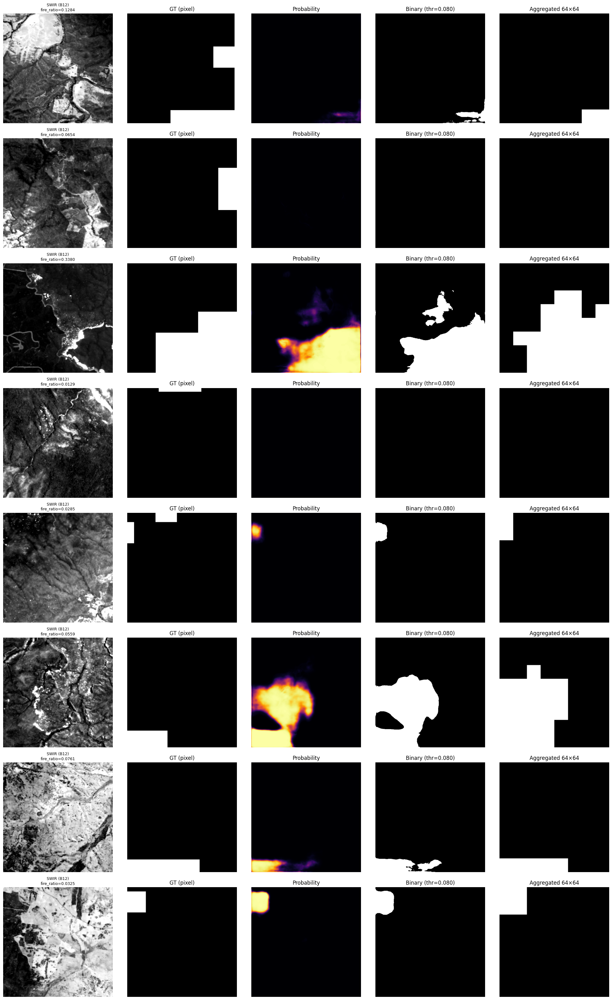

In [26]:
# halaman ke-1
show_page(all_fire_samples, page=0, per_page=SAMPLES_PER_PAGE)

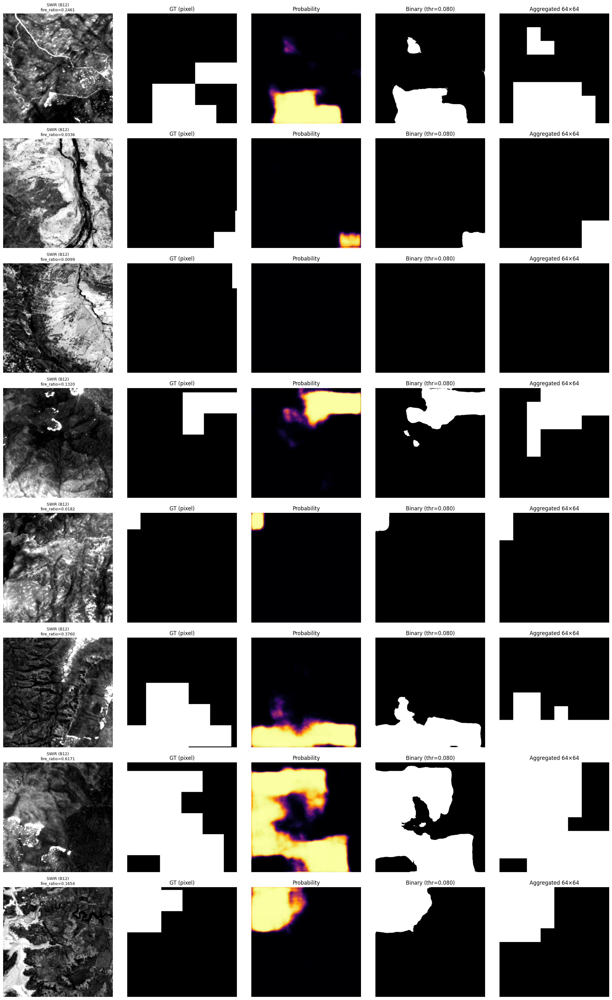

In [27]:
# halaman ke-2
show_page(all_fire_samples, page=1, per_page=SAMPLES_PER_PAGE)

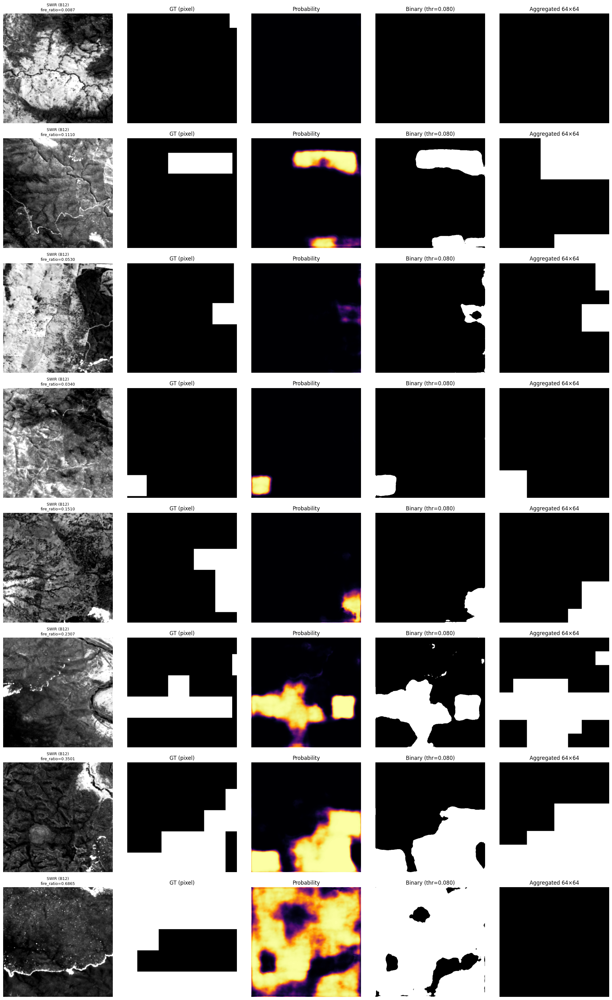

In [28]:
# halaman ke-3
show_page(all_fire_samples, page=2, per_page=SAMPLES_PER_PAGE)

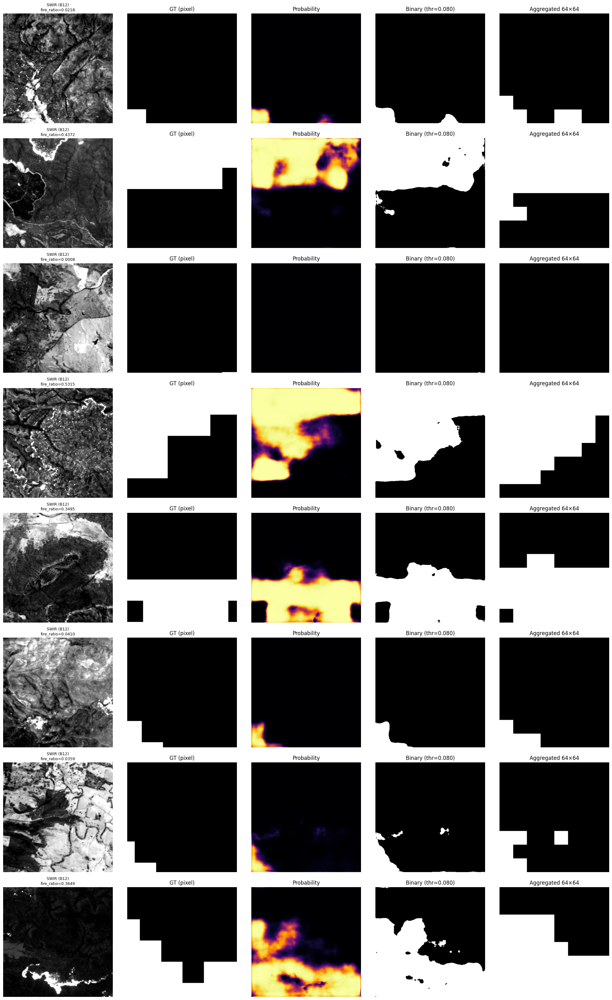

In [29]:
# halaman ke-4
show_page(all_fire_samples, page=3, per_page=SAMPLES_PER_PAGE)

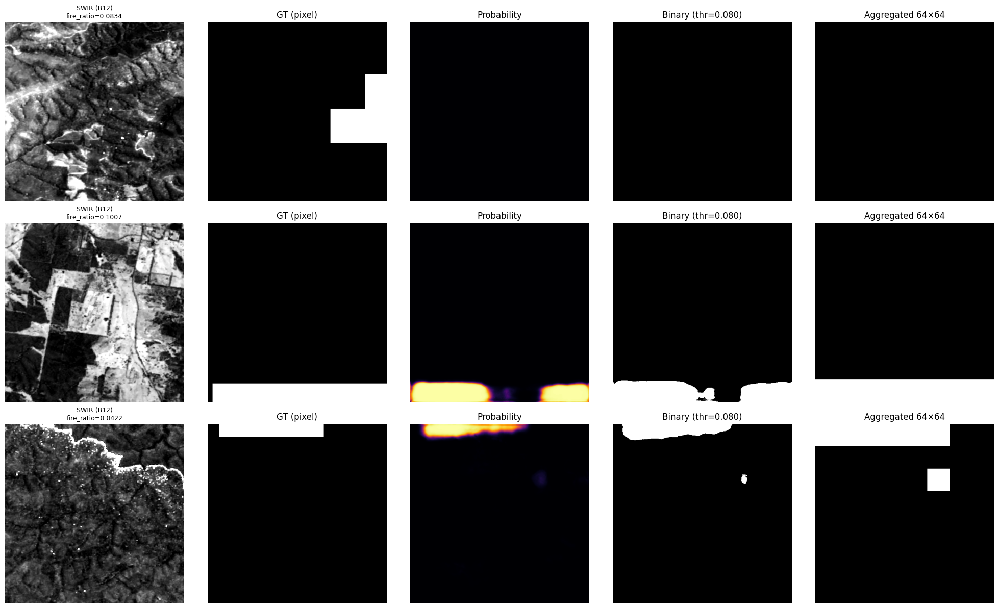

In [30]:
# halaman ke-5
show_page(all_fire_samples, page=4, per_page=SAMPLES_PER_PAGE)

# Aggregation Final

In [11]:
# ============================================================
# DYNAMIC THRESHOLD REPORT (Quantile-style like vis-blok-all_final)
# - Model: UNet-EffNet
# - Output:
#   (1) Pixel-wise metrics: Acc/Prec/Rec/F1/PR-AUC
#   (2) Threshold distribution summary (mean/std + quantiles)
#   (3) "Core" distribution (trim extremes) + recommended view
#   (4) GT block analysis (quantiles of fire pixels per block) + recommended LABEL_BLOCK_THR
# ============================================================

import os, numpy as np, torch, torch.nn.functional as F, pandas as pd
from sklearn.metrics import average_precision_score

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ----------------------------
# 0) Ensure model UNet-EffNet exists
# ----------------------------
try:
    unet_eff
    unet_eff = unet_eff.to(DEVICE).eval()
    print("[OK] Using existing unet_eff model from memory.")
except NameError:
    import segmentation_models_pytorch as smp

    UNET_EFFNET_PATH = "/kaggle/input/unet-effnet/pytorch/default/1/efficientb4_pretrained.pth"
    assert os.path.exists(UNET_EFFNET_PATH), f"Model path tidak ditemukan: {UNET_EFFNET_PATH}"

    def _extract_state_dict(ckpt_obj):
        if not isinstance(ckpt_obj, dict):
            raise ValueError("Checkpoint bukan dict")
        if "model_state" in ckpt_obj:
            return ckpt_obj["model_state"]
        for k in ["state_dict","model","net","weights"]:
            if k in ckpt_obj and isinstance(ckpt_obj[k], dict):
                return ckpt_obj[k]
        # raw state_dict
        if any(k.startswith(("encoder.","decoder.","segmentation_head")) for k in ckpt_obj.keys()):
            return ckpt_obj
        raise ValueError("Tidak ditemukan state_dict di checkpoint")

    def _try_load_state(model, ckpt_path):
        ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
        state = _extract_state_dict(ckpt)
        clean_state = {k.replace("module.",""): v for k,v in state.items()}
        model.load_state_dict(clean_state, strict=True)
        return model

    unet_eff = smp.Unet(
        encoder_name="efficientnet-b4",
        encoder_weights=None,
        in_channels=cfg.IN_CHANNELS,
        classes=1,
        activation=None
    ).to(DEVICE).eval()

    unet_eff = _try_load_state(unet_eff, UNET_EFFNET_PATH)
    print(f"[OK] Loaded UNet-EffNet from {UNET_EFFNET_PATH}")

# ----------------------------
# 1) Dynamic Threshold params (isi sesuai best kamu)
# ----------------------------
TEMPERATURE   = 1.0
ALPHA_ENTROPY = 0.08
BETA_CONF     = 0.20
T_MIN         = 0.08
T_MAX         = 0.95
BASE_BEST     = 0.08

# untuk analisis GT-block (pilih block terbaik kamu)
BLOCK_SIZE_FOR_GT_ANALYSIS = 64

# trim core distribusi (mirip gaya notebook)
Q_LOW  = 0.05
Q_HIGH = 0.95
Q_MIN  = 0.10  # untuk rekomendasi "minimum yang robust" di dalam core

# ----------------------------
# 2) Helpers
# ----------------------------
def _safe_div(a, b, eps=1e-12):
    return a / (b + eps)

def _q(x, qs):
    # robust: handle empty
    if len(x) == 0:
        return {f"Q{int(q*100)}": np.nan for q in qs}
    return {f"Q{int(q*100)}": float(np.quantile(x, q)) for q in qs}

@torch.no_grad()
def dynamic_threshold_from_probs_micro(probs, base, alpha_entropy, beta_conf, t_min=0.08, t_max=0.95):
    eps = 1e-8
    p = probs.clamp(eps, 1-eps)

    ent = -(p*torch.log(p) + (1-p)*torch.log(1-p))  # (B,1,H,W)
    ent_mean = ent.mean(dim=(1,2,3))
    ent_norm = ent_mean / 0.693

    conf = (p-0.5).abs().mean(dim=(1,2,3))
    conf_norm = conf / 0.5

    thr = base + alpha_entropy*(ent_norm-0.5) - beta_conf*(conf_norm-0.5)
    return thr.clamp(t_min, t_max)

@torch.no_grad()
def eval_dynamic_pixelwise_and_collect_thresholds(
    model, loader,
    temperature, base, alpha_entropy, beta_conf, t_min, t_max
):
    model.eval()

    TP=FP=TN=FN=0.0
    all_probs=[]
    all_labels=[]
    thr_all = []

    for x,y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        x = normalize_batch(x, MEAN_13, STD_13)

        logits = model(x)
        probs  = torch.sigmoid(logits / float(temperature))

        thr = dynamic_threshold_from_probs_micro(
            probs, base, alpha_entropy, beta_conf, t_min=t_min, t_max=t_max
        )
        pred = (probs >= thr.view(-1,1,1,1)).float()

        # confusion matrix pixel-wise
        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf==1) & (yf==1)).sum().item())
        FP += float(((pf==1) & (yf==0)).sum().item())
        TN += float(((pf==0) & (yf==0)).sum().item())
        FN += float(((pf==0) & (yf==1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())
        thr_all.append(thr.detach().cpu())

    acc  = _safe_div(TP+TN, TP+TN+FP+FN)
    prec = _safe_div(TP, TP+FP)
    rec  = _safe_div(TP, TP+FN)
    f1   = _safe_div(2*prec*rec, prec+rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    thr_np = torch.cat(thr_all).numpy().astype(np.float64)  # per-image threshold

    return {
        "Accuracy": float(acc),
        "Precision": float(prec),
        "Recall": float(rec),
        "F1": float(f1),
        "PR_AUC": float(pr_auc),
        "thr_values": thr_np
    }

def analyze_threshold_distribution(thr_values, q_low=0.05, q_high=0.95, q_min=0.10, title="THRESHOLD"):
    thr = np.asarray(thr_values, dtype=np.float64)
    thr = thr[~np.isnan(thr)]
    if thr.size == 0:
        print(f"[{title}] No threshold values.")
        return

    qs_main = [0.01,0.05,0.10,0.25,0.50,0.75,0.90,0.95,0.99]
    quant = _q(thr, qs_main)

    print(f"\n==== {title} DISTRIBUTION (all) ====")
    print(f"count={thr.size} | mean={thr.mean():.6f} std={thr.std():.6f} | min={thr.min():.6f} max={thr.max():.6f}")
    print("quantiles:", {k: round(v,6) for k,v in quant.items()})

    # core distribution (trim ekstrem)
    low  = float(np.quantile(thr, q_low))
    high = float(np.quantile(thr, q_high))
    core = thr[(thr >= low) & (thr <= high)]
    if core.size == 0:
        print(f"[{title}] core empty after trimming.")
        return

    core_quant = _q(core, qs_main)
    rec_min = float(np.quantile(core, q_min))

    print(f"\n==== {title} DISTRIBUTION (core trim {q_low:.2f}–{q_high:.2f}) ====")
    print(f"core_count={core.size} | mean={core.mean():.6f} std={core.std():.6f} | low={low:.6f} high={high:.6f}")
    print("core_quantiles:", {k: round(v,6) for k,v in core_quant.items()})
    print(f"recommended_min_like (Q{int(q_min*100)} of core) = {rec_min:.6f}")
    print("catatan: ini bukan 'ground truth', hanya ringkasan distribusi threshold per-sample agar print kamu konsisten & robust.")

@torch.no_grad()
def analyze_gt_blocks_from_loader(loader, block_size=32, q_low=0.05, q_high=0.95, q_min=0.10):
    """
    Versi dataloader (bukan baca npz manifest):
    - hitung fire_pixels per blok untuk blok yang ada fire saja
    - hitung ratio blok kosong
    - quantiles Q5/Q10/Q50/Q90/Q95
    - recommended_min_pixel (robust) + recommended_min_pixel_pct
    """
    fire_pixels = []
    zero_blocks = 0
    total_blocks = 0

    for x,y in loader:
        # y: (B,1,H,W)
        yb = (y > 0).to(torch.uint8)  # tetap di CPU saja untuk loop ringan
        yb = yb.cpu().numpy()

        B, C, H, W = yb.shape
        assert C == 1

        # hanya ambil area yang habis dibagi block_size supaya konsisten
        H2 = (H // block_size) * block_size
        W2 = (W // block_size) * block_size
        yb = yb[:,0,:H2,:W2]

        for b in range(B):
            yy = yb[b]
            for i in range(0, H2, block_size):
                for j in range(0, W2, block_size):
                    block = yy[i:i+block_size, j:j+block_size]
                    pix = int(block.sum())
                    total_blocks += 1
                    if pix == 0:
                        zero_blocks += 1
                    else:
                        fire_pixels.append(pix)

    fire_pixels = np.array(fire_pixels, dtype=np.float64)
    zero_ratio = zero_blocks / max(total_blocks,1)

    if fire_pixels.size == 0:
        return {
            "block_size": block_size,
            "total_blocks": total_blocks,
            "zero_block_ratio": zero_ratio,
            "fire_block_count": 0,
            "quantiles": {},
            "recommended_min_pixel": None,
            "recommended_min_pixel_pct": None
        }

    q5  = float(np.quantile(fire_pixels, 0.05))
    q10 = float(np.quantile(fire_pixels, 0.10))
    q50 = float(np.quantile(fire_pixels, 0.50))
    q90 = float(np.quantile(fire_pixels, 0.90))
    q95 = float(np.quantile(fire_pixels, 0.95))

    low  = float(np.quantile(fire_pixels, q_low))
    high = float(np.quantile(fire_pixels, q_high))
    core = fire_pixels[(fire_pixels >= low) & (fire_pixels <= high)]
    min_pixel = int(np.quantile(core, q_min)) if core.size > 0 else int(np.quantile(fire_pixels, q_min))

    return {
        "block_size": block_size,
        "total_blocks": int(total_blocks),
        "zero_block_ratio": float(zero_ratio),
        "fire_block_count": int(fire_pixels.size),
        "quantiles": {"Q5": q5, "Q10": q10, "Q50": q50, "Q90": q90, "Q95": q95},
        "recommended_min_pixel": int(min_pixel),
        "recommended_min_pixel_pct": float(min_pixel / (block_size * block_size))
    }

# ----------------------------
# 3) Run evaluation (pixel-wise) + print like notebook
# ----------------------------
out = eval_dynamic_pixelwise_and_collect_thresholds(
    unet_eff, test_loader,
    temperature=TEMPERATURE,
    base=BASE_BEST,
    alpha_entropy=ALPHA_ENTROPY,
    beta_conf=BETA_CONF,
    t_min=T_MIN, t_max=T_MAX
)

df_metric = pd.DataFrame([{
    "Model": "UNet-EffNet",
    "PostProcessing": "DynamicThreshold(BalancedBaseTune)",
    "Accuracy": out["Accuracy"],
    "Precision": out["Precision"],
    "Recall": out["Recall"],
    "F1": out["F1"],
    "PR_AUC": out["PR_AUC"],
    "temperature": TEMPERATURE,
    "base_best": BASE_BEST,
    "alpha_entropy": ALPHA_ENTROPY,
    "beta_conf": BETA_CONF,
    "t_min": T_MIN,
    "t_max": T_MAX,
}])
display(df_metric)

# print threshold distribution (quantile-style)
analyze_threshold_distribution(
    out["thr_values"],
    q_low=Q_LOW, q_high=Q_HIGH, q_min=Q_MIN,
    title="DYNAMIC THR (per-image)"
)

# ----------------------------
# 4) GT block analysis (quantile-style like notebook)
# ----------------------------
gt_info = analyze_gt_blocks_from_loader(
    test_loader,
    block_size=BLOCK_SIZE_FOR_GT_ANALYSIS,
    q_low=Q_LOW, q_high=Q_HIGH, q_min=Q_MIN
)

print(f"\n==== GT BLOCK ANALYSIS (block_size={gt_info['block_size']}) ====")
print(f"total_blocks      : {gt_info['total_blocks']}")
print(f"zero_block_ratio  : {gt_info['zero_block_ratio']:.6f}")
print(f"fire_block_count  : {gt_info['fire_block_count']}")

if gt_info["fire_block_count"] > 0:
    print("quantiles (fire pixels, fire-block only):",
          {k: int(v) for k,v in gt_info["quantiles"].items()})
    print(f"recommended_min_pixel      : {gt_info['recommended_min_pixel']}")
    print(f"recommended_LABEL_BLOCK_THR: {gt_info['recommended_min_pixel_pct']:.6f}  (min_pixel / {BLOCK_SIZE_FOR_GT_ANALYSIS}^2)")
    print("catatan: ini rekomendasi LABEL_BLOCK_THR (ratio) berdasarkan distribusi GT-blok (robust, buang ekstrem).")
else:
    print("[WARN] Tidak ada fire block terdeteksi di loader (cek y).")

DEVICE: cuda
[OK] Using existing unet_eff model from memory.


,Model,PostProcessing,Accuracy,Precision,Recall,F1,PR_AUC,temperature,base_best,alpha_entropy,beta_conf,t_min,t_max
0,UNet-EffNet,DynamicThreshold(BalancedBaseTune),0.990002,0.784985,0.809874,0.797235,0.837941,1.0,0.08,0.08,0.2,0.08,0.95



==== DYNAMIC THR (per-image) DISTRIBUTION (all) ====
count=246 | mean=0.080000 std=0.000000 | min=0.080000 max=0.080000
quantiles: {'Q1': 0.08, 'Q5': 0.08, 'Q10': 0.08, 'Q25': 0.08, 'Q50': 0.08, 'Q75': 0.08, 'Q90': 0.08, 'Q95': 0.08, 'Q99': 0.08}

==== DYNAMIC THR (per-image) DISTRIBUTION (core trim 0.05–0.95) ====
core_count=246 | mean=0.080000 std=0.000000 | low=0.080000 high=0.080000
core_quantiles: {'Q1': 0.08, 'Q5': 0.08, 'Q10': 0.08, 'Q25': 0.08, 'Q50': 0.08, 'Q75': 0.08, 'Q90': 0.08, 'Q95': 0.08, 'Q99': 0.08}
recommended_min_like (Q10 of core) = 0.080000
catatan: ini bukan 'ground truth', hanya ringkasan distribusi threshold per-sample agar print kamu konsisten & robust.

==== GT BLOCK ANALYSIS (block_size=64) ====
total_blocks      : 15744
zero_block_ratio  : 0.965574
fire_block_count  : 542
quantiles (fire pixels, fire-block only): {'Q5': 250, 'Q10': 576, 'Q50': 3600, 'Q90': 4096, 'Q95': 4096}
recommended_min_pixel      : 765
recommended_LABEL_BLOCK_THR: 0.186768  (min_pixel 

DEVICE: cuda


,Model,PostProcessing,Accuracy,Precision,Recall,F1,PR_AUC,temperature,base_best,alpha_entropy,beta_conf,t_min,Thr_mean,Thr_std
0,UNet-EffNet,DynamicThreshold(BalancedBaseTune),0.990002,0.784985,0.809874,0.797235,0.837941,1.0,0.08,0.08,0.2,0.08,0.08,7.450581e-09



==== DYNAMIC THR (per-image) DISTRIBUTION (all) ====
count=246 | mean=0.080000 std=0.000000 | min=0.080000 max=0.080000
quantiles: {'Q01': 0.07999999821186066, 'Q05': 0.07999999821186066, 'Q10': 0.07999999821186066, 'Q25': 0.07999999821186066, 'Q50': 0.07999999821186066, 'Q75': 0.07999999821186066, 'Q90': 0.07999999821186066, 'Q95': 0.07999999821186066, 'Q99': 0.07999999821186066}

==== DYNAMIC THR (per-image) DISTRIBUTION (core trim 0.05–0.95) ====
core_count=246 | mean=0.080000 std=0.000000 | low=0.080000 high=0.080000
core_quantiles: {'Q01': 0.07999999821186066, 'Q05': 0.07999999821186066, 'Q10': 0.07999999821186066, 'Q25': 0.07999999821186066, 'Q50': 0.07999999821186066, 'Q75': 0.07999999821186066, 'Q90': 0.07999999821186066, 'Q95': 0.07999999821186066, 'Q99': 0.07999999821186066}
recommended_min_like (Q10 of core) = 0.080000
catatan: ini ringkasan distribusi threshold per-sample agar print kamu konsisten & robust.

==== GT BLOCK ANALYSIS (block_size=64) ====
total_blocks     : 15

,Agg_k,Accuracy,Precision,Recall,F1,PR_AUC,Block_thr,Label_block_thr,Thr_mean_px,Thr_std_px
0,8,0.989440,0.771858,0.822958,0.796589,0.839590,0.05,0.140625,0.08,7.450581e-09
1,16,0.988992,0.767670,0.831313,0.798225,0.838057,0.05,0.140625,0.08,7.450581e-09
2,32,0.988138,0.756285,0.844215,0.797835,0.833696,0.05,0.140625,0.08,7.450581e-09
3,64,0.987170,0.760360,0.859470,0.806883,0.836572,0.05,0.140625,0.08,7.450581e-09



[OK] Best block size (by block-level F1) = 64  | F1=0.806883
[INFO] Plotting 12 fire samples (best_k=64) ...


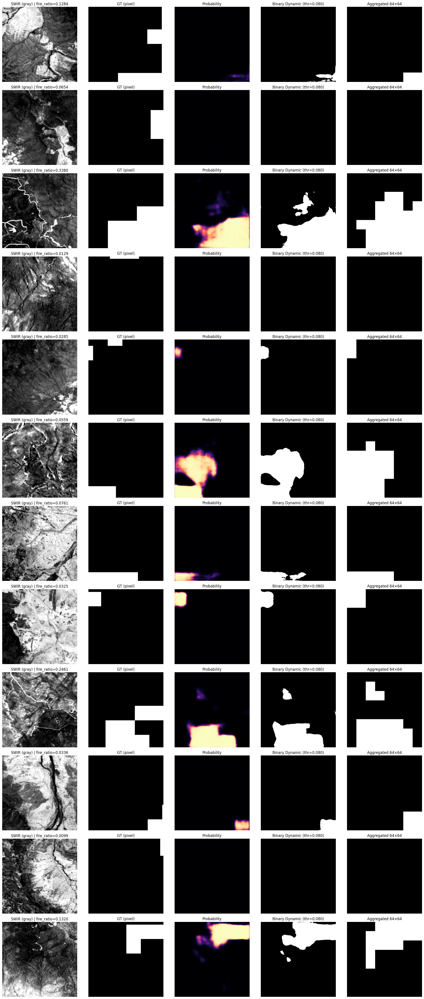


DONE.
Catatan penting:
- Jika kamu merasa visual 'kasar' tapi F1 tinggi: itu biasanya karena F1 dihitung di level BLOK (lebih forgiving).
- Kalau mau F1 per-pixel setelah agregasi: metrik harus dibandingkan pred_up (upsampled) vs GT pixel (bukan GT blok).


In [12]:
# ============================================================
# DYNAMIC THR PRINT (quantile + core trim) + GT BLOCK ANALYSIS
# + AGG EXP (8/16/32/64) + PICK BEST + VISUALIZE SAMPLES
# ============================================================

import numpy as np
import torch
import torch.nn.functional as F
import pandas as pd
from sklearn.metrics import average_precision_score
import matplotlib.pyplot as plt
import math

# ----------------------------
# 0) Safety checks / device
# ----------------------------
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

assert "test_loader" in globals(), "test_loader belum ada."
assert "cfg" in globals(), "cfg belum ada."
assert hasattr(cfg, "IN_CHANNELS"), "cfg.IN_CHANNELS tidak ada."

# normalize_batch fallback (kalau belum ada)
if "normalize_batch" not in globals():
    def normalize_batch(x, mean_13, std_13):
        mean_t = torch.tensor(mean_13, device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
        std_t  = torch.tensor(std_13,  device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
        return (x - mean_t) / (std_t + 1e-6)
    print("[WARN] normalize_batch tidak ditemukan, pakai fallback.")

# mean/std fallback (kalau belum ada)
if "MEAN_13" not in globals(): MEAN_13 = [0.0]*cfg.IN_CHANNELS
if "STD_13"  not in globals(): STD_13  = [1.0]*cfg.IN_CHANNELS

# pastikan model ada
assert "unet_eff" in globals(), "unet_eff belum ada (load model dulu)."
unet_eff = unet_eff.to(DEVICE).eval()

# ----------------------------
# 1) Parameter dynamic thr (isi sesuai best kamu)
# ----------------------------
TEMPERATURE   = 1.0
ALPHA_ENTROPY = 0.08
BETA_CONF     = 0.20
T_MIN         = 0.08
T_MAX         = 0.95
BASE_BEST     = 0.08

# Aggregation configs
K_LIST = [8, 16, 32, 64]

# BLOCK_THR = threshold untuk "rasio fire" pada pred blok
# LABEL_BLOCK_THR = threshold untuk "rasio fire" pada GT blok
# Awalnya set kecil dulu, nanti kita rekomendasikan dari GT analysis
BLOCK_THR_INIT = 0.05
LABEL_BLOCK_THR_INIT = 0.05

# Visual settings
SAMPLES_TO_PLOT = 12   # jumlah sampel fire yang diplot (biar tidak kebanyakan)
MIN_FIRE_RATIO  = 0.0001  # filter biar benar-benar ada fire (bukan 0)
SEED_SHOW = 42

# ----------------------------
# 2) Dynamic threshold (micro-adjust)
# ----------------------------
@torch.no_grad()
def dynamic_threshold_from_probs_micro(probs, base, alpha_entropy, beta_conf, t_min=0.08, t_max=0.95):
    eps = 1e-8
    p = probs.clamp(eps, 1-eps)

    ent = -(p*torch.log(p) + (1-p)*torch.log(1-p))  # (B,1,H,W)
    ent_mean = ent.mean(dim=(1,2,3))
    ent_norm = ent_mean / 0.693  # normalisasi entropy max=ln2

    conf = (p-0.5).abs().mean(dim=(1,2,3))
    conf_norm = conf / 0.5

    thr = base + alpha_entropy*(ent_norm - 0.5) - beta_conf*(conf_norm - 0.5)
    return thr.clamp(t_min, t_max)

@torch.no_grad()
def forward_dynamic(model, x):
    logits = model(x)  # (B,1,H,W)
    probs  = torch.sigmoid(logits / float(TEMPERATURE))
    thr    = dynamic_threshold_from_probs_micro(probs, BASE_BEST, ALPHA_ENTROPY, BETA_CONF, T_MIN, T_MAX)
    pred   = (probs >= thr.view(-1,1,1,1)).float()
    return probs, pred, thr

# ----------------------------
# 3) Helpers: quantile printing (mirip notebook vis)
# ----------------------------
def _np_quantiles(arr, qs=(0.01,0.05,0.10,0.25,0.50,0.75,0.90,0.95,0.99)):
    out = {}
    for q in qs:
        out[f"Q{int(q*100):02d}"] = float(np.quantile(arr, q))
    return out

def print_thr_distribution(thr_values, title="DYNAMIC THR (per-image) DISTRIBUTION"):
    thr_values = np.asarray(thr_values, dtype=np.float64)
    print(f"\n==== {title} (all) ====")
    print(f"count={len(thr_values)} | mean={thr_values.mean():.6f} std={thr_values.std():.6f} | "
          f"min={thr_values.min():.6f} max={thr_values.max():.6f}")
    print("quantiles:", _np_quantiles(thr_values))

    # core trim 0.05-0.95 (buang ekstrem)
    lo = np.quantile(thr_values, 0.05)
    hi = np.quantile(thr_values, 0.95)
    core = thr_values[(thr_values >= lo) & (thr_values <= hi)]

    print(f"\n==== {title} (core trim 0.05–0.95) ====")
    print(f"core_count={len(core)} | mean={core.mean():.6f} std={core.std():.6f} | "
          f"low={lo:.6f} high={hi:.6f}")
    print("core_quantiles:", _np_quantiles(core))
    # rekomendasi min-like (biasanya Q10 core)
    rec_min_like = float(np.quantile(core, 0.10)) if len(core)>0 else float(lo)
    print(f"recommended_min_like (Q10 of core) = {rec_min_like:.6f}")
    print("catatan: ini ringkasan distribusi threshold per-sample agar print kamu konsisten & robust.")

# ----------------------------
# 4) Block aggregation helpers
# ----------------------------
def crop_to_multiple(t, k):
    H, W = t.shape[-2], t.shape[-1]
    H2 = (H // k) * k
    W2 = (W // k) * k
    if H2 == H and W2 == W:
        return t
    return t[..., :H2, :W2]

@torch.no_grad()
def block_ratio(t, k):
    t = crop_to_multiple(t, k)  # (B,1,H2,W2)
    return F.avg_pool2d(t, kernel_size=k, stride=k)  # (B,1,H2/k,W2/k)

@torch.no_grad()
def upsample_nearest(t_small, out_hw):
    return F.interpolate(t_small, size=out_hw, mode="nearest")

# ----------------------------
# 5) Evaluate (block-level metrics) for given k
# ----------------------------
def _safe_div(a, b, eps=1e-12):
    return a / (b + eps)

@torch.no_grad()
def eval_agg_block_metrics(model, loader, k, block_thr, label_block_thr):
    model.eval()
    TP=FP=TN=FN=0.0
    all_probs=[]
    all_labels=[]
    thr_list=[]

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        x = normalize_batch(x, MEAN_13, STD_13)
        probs_px, pred_px, thr = forward_dynamic(model, x)
        thr_list.append(thr.detach().cpu())

        # ratio per block
        pred_ratio = block_ratio(pred_px, k)
        gt_ratio   = block_ratio(y.float(), k)
        prob_ratio = block_ratio(probs_px, k)  # soft untuk PR-AUC

        pred_blk = (pred_ratio >= block_thr).float()
        gt_blk   = (gt_ratio   >= label_block_thr).float()

        pf = pred_blk.view(-1)
        yf = gt_blk.view(-1)

        TP += float(((pf==1) & (yf==1)).sum().item())
        FP += float(((pf==1) & (yf==0)).sum().item())
        TN += float(((pf==0) & (yf==0)).sum().item())
        FN += float(((pf==0) & (yf==1)).sum().item())

        all_probs.append(prob_ratio.detach().view(-1).cpu())
        all_labels.append(gt_blk.detach().view(-1).cpu())

    acc  = _safe_div(TP+TN, TP+TN+FP+FN)
    prec = _safe_div(TP, TP+FP)
    rec  = _safe_div(TP, TP+FN)
    f1   = _safe_div(2*prec*rec, prec+rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    thr_all = torch.cat(thr_list).numpy()
    return dict(
        Agg_k=int(k),
        Accuracy=float(acc),
        Precision=float(prec),
        Recall=float(rec),
        F1=float(f1),
        PR_AUC=float(pr_auc),
        Block_thr=float(block_thr),
        Label_block_thr=float(label_block_thr),
        Thr_mean_px=float(thr_all.mean()),
        Thr_std_px=float(thr_all.std())
    )

# ----------------------------
# 6) GT BLOCK ANALYSIS (mirip notebook vis)
#    Tujuan: rekomendasi LABEL_BLOCK_THR yang robust dari distribusi GT blok
# ----------------------------
@torch.no_grad()
def gt_block_analysis(loader, block_size=64):
    fire_pixel_counts = []
    zero_block_count = 0
    total_blocks = 0

    for x, y in loader:
        y = y.to(DEVICE).float()  # (B,1,H,W)
        y_crop = crop_to_multiple(y, block_size)
        # hitung fire pixels per block (bukan ratio)
        # sum_pool = avg_pool * (k*k)
        y_ratio = F.avg_pool2d(y_crop, kernel_size=block_size, stride=block_size)
        y_sum   = y_ratio * float(block_size*block_size)

        # flatten blocks
        y_sum_flat = y_sum.view(-1).detach().cpu().numpy()
        total_blocks += y_sum_flat.shape[0]
        zero_block_count += int((y_sum_flat == 0).sum())

        # simpan hanya block yang ada fire (>0)
        fire_only = y_sum_flat[y_sum_flat > 0]
        fire_pixel_counts.extend(list(fire_only))

    fire_pixel_counts = np.array(fire_pixel_counts, dtype=np.float64)
    zero_block_ratio = zero_block_count / max(total_blocks, 1)

    out = {
        "total_blocks": int(total_blocks),
        "zero_block_ratio": float(zero_block_ratio),
        "fire_block_count": int(len(fire_pixel_counts)),
        "fire_pixel_counts": fire_pixel_counts
    }
    return out

def print_gt_block_analysis(res, block_size=64):
    fire_pix = res["fire_pixel_counts"]
    print(f"\n==== GT BLOCK ANALYSIS (block_size={block_size}) ====")
    print(f"total_blocks     : {res['total_blocks']}")
    print(f"zero_block_ratio : {res['zero_block_ratio']:.6f}")
    print(f"fire_block_count : {res['fire_block_count']}")

    if len(fire_pix) == 0:
        print("[WARN] Tidak ada fire block sama sekali (cek label/loader).")
        return None

    # quantiles (fire pixel count, fire-block only)
    qs = {
        "Q05": float(np.quantile(fire_pix, 0.05)),
        "Q10": float(np.quantile(fire_pix, 0.10)),
        "Q50": float(np.quantile(fire_pix, 0.50)),
        "Q90": float(np.quantile(fire_pix, 0.90)),
        "Q95": float(np.quantile(fire_pix, 0.95)),
    }
    print("quantiles (fire pixels, fire-block only):", qs)

    # rekomendasi: min_pixel pakai Q10 (robust, buang ekstrim kecil)
    rec_min_pixel = int(round(qs["Q10"]))
    rec_label_thr = float(rec_min_pixel / float(block_size*block_size))
    print(f"recommended_min_pixel     : {rec_min_pixel}")
    print(f"recommended_LABEL_BLOCK_THR : {rec_label_thr:.6f} (min_pixel / {block_size}^2)")
    print("catatan: ini rekomendasi LABEL_BLOCK_THR (ratio) berdasarkan distribusi GT-block (robust, buang ekstrim).")

    return rec_label_thr

# ----------------------------
# 7) Kumpulkan thr per-image (untuk distribusi print)
# ----------------------------
@torch.no_grad()
def collect_thr_per_image(model, loader, max_batches=None):
    model.eval()
    thr_vals = []
    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break
        x = x.to(DEVICE)
        x = normalize_batch(x, MEAN_13, STD_13)
        probs, pred, thr = forward_dynamic(model, x)
        thr_vals.extend(list(thr.detach().cpu().numpy().reshape(-1)))
    return np.array(thr_vals, dtype=np.float64)

# ----------------------------
# 8) Visualisasi SWIR grayscale (bukan false-color)
#    Sentinel-2: SWIR biasanya B11 & B12 (dan opsional B8A/NIR).
#    Dataset kamu 13-channel; indeks band bisa beda tergantung preprocessing.
#    Di sini kita ambil default: pakai channel 10/11 kalau ada (B11/B12).
# ----------------------------
def make_swir_grayscale(x_chw, idx_swir=10, gamma=1.0):
    """
    x_chw: torch (C,H,W) unnormalized (yang kamu simpan dari loader sebelum normalize)
    idx_swir: index channel untuk ditampilkan grayscale
    """
    c, h, w = x_chw.shape
    idx = min(idx_swir, c-1)
    img = x_chw[idx].detach().cpu().numpy().astype(np.float32)
    # normalize 0-1 robust (percentile)
    lo, hi = np.percentile(img, 2), np.percentile(img, 98)
    img = (img - lo) / (hi - lo + 1e-6)
    img = np.clip(img, 0, 1)
    img = img ** (1.0/gamma)
    return img

# ----------------------------
# 9) Plot samples fire (pakai best_k)
# ----------------------------
@torch.no_grad()
def plot_fire_samples(model, loader, best_k, block_thr, label_block_thr, max_samples=12, seed=42):
    rng = np.random.default_rng(seed)
    collected = []

    model.eval()
    for x, y in loader:
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        # fire_ratio per image (pixel-level)
        valid = (y==0) | (y==1)
        fire_ratio = (y*valid).sum(dim=(1,2,3)) / (valid.sum(dim=(1,2,3)) + 1e-6)

        idxs = (fire_ratio > MIN_FIRE_RATIO).nonzero(as_tuple=False).view(-1)
        if idxs.numel() == 0:
            continue

        x_norm = normalize_batch(x, MEAN_13, STD_13)
        probs_px, pred_px, thr = forward_dynamic(model, x_norm)

        # aggregated pred (block), lalu upsample untuk display pixel
        pred_ratio = block_ratio(pred_px, best_k)
        pred_blk   = (pred_ratio >= block_thr).float()
        pred_up    = upsample_nearest(pred_blk, pred_px.shape[-2:])

        # ambil sample
        for i in idxs.tolist():
            collected.append({
                "x": x[i].detach().cpu(),          # unnormalized for display
                "y": y[i,0].detach().cpu(),
                "probs": probs_px[i,0].detach().cpu(),
                "pred_px": pred_px[i,0].detach().cpu(),
                "pred_up": pred_up[i,0].detach().cpu(),
                "thr": float(thr[i].detach().cpu()),
                "fire_ratio": float(fire_ratio[i].detach().cpu()),
            })

        if len(collected) >= max_samples:
            break

    if len(collected) == 0:
        print("[WARN] Tidak ada sample fire yang ditemukan.")
        return

    print(f"[INFO] Plotting {min(len(collected), max_samples)} fire samples (best_k={best_k}) ...")

    n = min(len(collected), max_samples)
    fig, axes = plt.subplots(n, 5, figsize=(20, 3.8*n))
    if n == 1:
        axes = axes[None, :]

    for r in range(n):
        s = collected[r]
        swir = make_swir_grayscale(s["x"], idx_swir=10, gamma=1.0)

        axes[r,0].imshow(swir, cmap="gray", vmin=0, vmax=1)
        axes[r,0].set_title(f"SWIR (gray) | fire_ratio={s['fire_ratio']:.4f}")
        axes[r,0].axis("off")

        axes[r,1].imshow(s["y"], cmap="gray")
        axes[r,1].set_title("GT (pixel)")
        axes[r,1].axis("off")

        axes[r,2].imshow(s["probs"], cmap="magma", vmin=0, vmax=1)
        axes[r,2].set_title("Probability")
        axes[r,2].axis("off")

        axes[r,3].imshow(s["pred_px"], cmap="gray")
        axes[r,3].set_title(f"Binary Dynamic (thr={s['thr']:.3f})")
        axes[r,3].axis("off")

        axes[r,4].imshow(s["pred_up"], cmap="gray")
        axes[r,4].set_title(f"Aggregated {best_k}×{best_k}")
        axes[r,4].axis("off")

    plt.tight_layout()
    plt.show()

# ============================================================
# A) Print tabel performa model (opsional: kalau kamu mau 1 row saja)
# ============================================================
# (Kalau kamu sudah punya tabel df sebelumnya, bagian ini boleh di-skip.)
# Kita hitung ulang cepat pixel-level metrics dynamic (tanpa agregasi) untuk sanity check.
@torch.no_grad()
def eval_dynamic_pixel(model, loader):
    model.eval()
    TP=FP=TN=FN=0.0
    all_probs=[]
    all_labels=[]
    thr_list=[]
    for x, y in loader:
        x = x.to(DEVICE); y = y.to(DEVICE)
        x = normalize_batch(x, MEAN_13, STD_13)
        probs, pred, thr = forward_dynamic(model, x)
        thr_list.append(thr.detach().cpu())

        pf = pred.view(-1)
        yf = y.view(-1)

        TP += float(((pf==1)&(yf==1)).sum().item())
        FP += float(((pf==1)&(yf==0)).sum().item())
        TN += float(((pf==0)&(yf==0)).sum().item())
        FN += float(((pf==0)&(yf==1)).sum().item())

        all_probs.append(probs.detach().view(-1).cpu())
        all_labels.append(y.detach().view(-1).cpu())

    acc  = _safe_div(TP+TN, TP+TN+FP+FN)
    prec = _safe_div(TP, TP+FP)
    rec  = _safe_div(TP, TP+FN)
    f1   = _safe_div(2*prec*rec, prec+rec)

    probs_np  = torch.cat(all_probs).numpy().astype(np.float64)
    labels_np = torch.cat(all_labels).numpy().astype(np.int32)
    pr_auc = float(average_precision_score(labels_np, probs_np))

    thr_all = torch.cat(thr_list).numpy()
    return dict(Accuracy=float(acc), Precision=float(prec), Recall=float(rec), F1=float(f1), PR_AUC=float(pr_auc),
                Thr_mean=float(thr_all.mean()), Thr_std=float(thr_all.std()))

pix_m = eval_dynamic_pixel(unet_eff, test_loader)
df_one = pd.DataFrame([{
    "Model":"UNet-EffNet",
    "PostProcessing":"DynamicThreshold(BalancedBaseTune)",
    "Accuracy":pix_m["Accuracy"],
    "Precision":pix_m["Precision"],
    "Recall":pix_m["Recall"],
    "F1":pix_m["F1"],
    "PR_AUC":pix_m["PR_AUC"],
    "temperature":TEMPERATURE,
    "base_best":BASE_BEST,
    "alpha_entropy":ALPHA_ENTROPY,
    "beta_conf":BETA_CONF,
    "t_min":T_MIN,
    "Thr_mean":pix_m["Thr_mean"],
    "Thr_std":pix_m["Thr_std"],
}])
display(df_one)

# ============================================================
# B) Print distribusi threshold per-image (quantile + core trim)
# ============================================================
thr_vals = collect_thr_per_image(unet_eff, test_loader, max_batches=None)
print_thr_distribution(thr_vals, title="DYNAMIC THR (per-image) DISTRIBUTION")

# ============================================================
# C) GT block analysis untuk rekomendasi LABEL_BLOCK_THR (pakai best_k=64 dulu)
# ============================================================
gt_res_64 = gt_block_analysis(test_loader, block_size=64)
rec_label_thr_64 = print_gt_block_analysis(gt_res_64, block_size=64)

# kalau ada rekomendasi, pakai itu; kalau tidak, fallback ke INIT
LABEL_BLOCK_THR = float(rec_label_thr_64) if rec_label_thr_64 is not None else float(LABEL_BLOCK_THR_INIT)
BLOCK_THR = float(BLOCK_THR_INIT)

print(f"\n[INFO] Using thresholds for aggregation test:")
print(f"  BLOCK_THR      = {BLOCK_THR:.6f}")
print(f"  LABEL_BLOCK_THR= {LABEL_BLOCK_THR:.6f}")

# ============================================================
# D) Eksperimen agregasi (8/16/32/64) -> pilih best_k by F1 (block-level)
# ============================================================
rows=[]
for k in K_LIST:
    r = eval_agg_block_metrics(unet_eff, test_loader, k, BLOCK_THR, LABEL_BLOCK_THR)
    rows.append(r)

df_agg = pd.DataFrame(rows)[[
    "Agg_k","Accuracy","Precision","Recall","F1","PR_AUC","Block_thr","Label_block_thr","Thr_mean_px","Thr_std_px"
]]
display(df_agg)

best_row = df_agg.sort_values("F1", ascending=False).iloc[0].to_dict()
BEST_K = int(best_row["Agg_k"])
print(f"\n[OK] Best block size (by block-level F1) = {BEST_K}  | F1={best_row['F1']:.6f}")

# ============================================================
# E) Plot sample fire (gunakan BEST_K)
# ============================================================
plot_fire_samples(
    unet_eff, test_loader,
    best_k=BEST_K,
    block_thr=BLOCK_THR,
    label_block_thr=LABEL_BLOCK_THR,
    max_samples=SAMPLES_TO_PLOT,
    seed=SEED_SHOW
)

print("\nDONE.")
print("Catatan penting:")
print("- Jika kamu merasa visual 'kasar' tapi F1 tinggi: itu biasanya karena F1 dihitung di level BLOK (lebih forgiving).")
print("- Kalau mau F1 per-pixel setelah agregasi: metrik harus dibandingkan pred_up (upsampled) vs GT pixel (bukan GT blok).")